<a href="https://colab.research.google.com/github/Gyuuul2/colabfold-protocol/blob/main/LAT1_conformation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<img src="https://raw.githubusercontent.com/sokrypton/ColabFold/main/.github/ColabFold_Marv_Logo_Small.png" height="200" align="right" style="height:240px">

##ColabFold v1.5.2-patch: AlphaFold2 using MMseqs2

Easy to use protein structure and complex prediction using [AlphaFold2](https://www.nature.com/articles/s41586-021-03819-2) and [Alphafold2-multimer](https://www.biorxiv.org/content/10.1101/2021.10.04.463034v1). Sequence alignments/templates are generated through [MMseqs2](mmseqs.com) and [HHsearch](https://github.com/soedinglab/hh-suite). For more details, see <a href="#Instructions">bottom</a> of the notebook, checkout the [ColabFold GitHub](https://github.com/sokrypton/ColabFold) and read our manuscript.
Old versions: [v1.4](https://colab.research.google.com/github/sokrypton/ColabFold/blob/v1.4.0/AlphaFold2.ipynb), [v1.5.1](https://colab.research.google.com/github/sokrypton/ColabFold/blob/v1.5.1/AlphaFold2.ipynb)

[Mirdita M, Schütze K, Moriwaki Y, Heo L, Ovchinnikov S, Steinegger M. ColabFold: Making protein folding accessible to all.
*Nature Methods*, 2022](https://www.nature.com/articles/s41592-022-01488-1)

-----------

### News
- <b><font color='green'>2023/07/31: The ColabFold MSA server is back to normal. It was using older DB (UniRef30 2202/PDB70 220313) from 27th ~8:30 AM CEST to 31st ~11:10 AM CEST.</font></b>
- <b><font color='green'>2023/06/12: New databases! UniRef30 updated to 2023_02 and PDB to 230517. We now use PDB100 instead of PDB70 (see [notes](#pdb100)).</font></b>
- <b><font color='green'>2023/06/12: We introduced a new default pairing strategy: Previously, for multimer predictions with more than 2 chains, we only pair if all sequences taxonomically match ("complete" pairing). The new default "greedy" strategy pairs any taxonomically matching subsets.</font></b>

In [ ]:
#@title Input protein sequence(s), then hit `Runtime` -> `Run all`
from google.colab import files
import os
import re
import hashlib
import random

from sys import version_info
python_version = f"{version_info.major}.{version_info.minor}"

def add_hash(x,y):
  return x+"_"+hashlib.sha1(y.encode()).hexdigest()[:5]

query_sequence = 'MAGAGPKRRALAAPAAEEKEEAREKMLAAKSADGSAPAGEGEGVTLQRNITLLNGVAIIV GTIIGSGIFVTPTGVLKEAGSPGLALVVWAACGVFSIVGALCYAELGTTISKSGGDYAYM LEVYGSLPAFLKLWIELLIIRPSSQYIVALVFATYLLKPLFPTCPVPEEAAKLVACLCVL LLTAVNCYSVKAATRVQDAFAAAKLLALALIILLGFVQIGKGDVSNLDPNFSFEGTKLDV GNIVLALYSGLFAYGGWNYLNFVTEEMINPYRNLPLAIIISLPIVTLVYVLTNLAYFTTL STEQMLSSEAVAVDFGNYHLGVMSWIIPVFVGLSCFGSVNGSLFTSSRLFFVGSREGHLP SILSMIHPQLLTPVPSLVFTCVMTLLYAFSKDIFSVINFFSFFNWLCVALAIIGMIWLRH RKPELERPIKVNLALPVFFILACLFLIAVSFWKTPVECGIGFTIILSGLPVYFFGVWWKN KPKWLLQGIFSTTVLCQKLMQVVPQET' #@param {type:"string"}
#@markdown  - Use `:` to specify inter-protein chainbreaks for **modeling complexes** (supports homo- and hetro-oligomers). For example **PI...SK:PI...SK** for a homodimer
jobname = 'LAT1_conformation' #@param {type:"string"}
# number of models to use
num_relax = 0 #@param [0, 1, 5] {type:"raw"}
#@markdown - specify how many of the top ranked structures to relax using amber
template_mode = "none" #@param ["none", "pdb100","custom"]
#@markdown - `none` = no template information is used. `pdb100` = detect templates in pdb100 (see [notes](#pdb100)). `custom` - upload and search own templates (PDB or mmCIF format, see [notes](#custom_templates))

use_amber = num_relax > 0

# remove whitespaces
query_sequence = "".join(query_sequence.split())

basejobname = "".join(jobname.split())
basejobname = re.sub(r'\W+', '', basejobname)
jobname = add_hash(basejobname, query_sequence)

# check if directory with jobname exists
def check(folder):
  if os.path.exists(folder):
    return False
  else:
    return True
if not check(jobname):
  n = 0
  while not check(f"{jobname}_{n}"): n += 1
  jobname = f"{jobname}_{n}"

# make directory to save results
os.makedirs(jobname, exist_ok=True)

# save queries
queries_path = os.path.join(jobname, f"{jobname}.csv")
with open(queries_path, "w") as text_file:
  text_file.write(f"id,sequence\n{jobname},{query_sequence}")

if template_mode == "pdb100":
  use_templates = True
  custom_template_path = None
elif template_mode == "custom":
  custom_template_path = os.path.join(jobname,f"template")
  os.makedirs(custom_template_path, exist_ok=True)
  uploaded = files.upload()
  use_templates = True
  for fn in uploaded.keys():
    os.rename(fn,os.path.join(custom_template_path,fn))
else:
  custom_template_path = None
  use_templates = False

print("jobname",jobname)
print("sequence",query_sequence)
print("length",len(query_sequence.replace(":","")))



jobname LAT1_conformation_1ab5d
sequence MAGAGPKRRALAAPAAEEKEEAREKMLAAKSADGSAPAGEGEGVTLQRNITLLNGVAIIVGTIIGSGIFVTPTGVLKEAGSPGLALVVWAACGVFSIVGALCYAELGTTISKSGGDYAYMLEVYGSLPAFLKLWIELLIIRPSSQYIVALVFATYLLKPLFPTCPVPEEAAKLVACLCVLLLTAVNCYSVKAATRVQDAFAAAKLLALALIILLGFVQIGKGDVSNLDPNFSFEGTKLDVGNIVLALYSGLFAYGGWNYLNFVTEEMINPYRNLPLAIIISLPIVTLVYVLTNLAYFTTLSTEQMLSSEAVAVDFGNYHLGVMSWIIPVFVGLSCFGSVNGSLFTSSRLFFVGSREGHLPSILSMIHPQLLTPVPSLVFTCVMTLLYAFSKDIFSVINFFSFFNWLCVALAIIGMIWLRHRKPELERPIKVNLALPVFFILACLFLIAVSFWKTPVECGIGFTIILSGLPVYFFGVWWKNKPKWLLQGIFSTTVLCQKLMQVVPQET
length 507


In [ ]:
#@title Install dependencies
%%time
import os
USE_AMBER = use_amber
USE_TEMPLATES = use_templates
PYTHON_VERSION = python_version

if not os.path.isfile("COLABFOLD_READY"):
  print("installing colabfold...")
  os.system("pip install -q --no-warn-conflicts 'colabfold[alphafold-minus-jax] @ git+https://github.com/sokrypton/ColabFold'")
  os.system("pip install --upgrade dm-haiku")
  os.system("ln -s /usr/local/lib/python3.*/dist-packages/colabfold colabfold")
  os.system("ln -s /usr/local/lib/python3.*/dist-packages/alphafold alphafold")
  # patch for jax > 0.3.25
  os.system("sed -i 's/weights = jax.nn.softmax(logits)/logits=jnp.clip(logits,-1e8,1e8);weights=jax.nn.softmax(logits)/g' alphafold/model/modules.py")
  os.system("touch COLABFOLD_READY")

if USE_AMBER or USE_TEMPLATES:
  if not os.path.isfile("CONDA_READY"):
    print("installing conda...")
    os.system("wget -qnc https://github.com/conda-forge/miniforge/releases/latest/download/Mambaforge-Linux-x86_64.sh")
    os.system("bash Mambaforge-Linux-x86_64.sh -bfp /usr/local")
    os.system("mamba config --set auto_update_conda false")
    os.system("touch CONDA_READY")

if USE_TEMPLATES and not os.path.isfile("HH_READY") and USE_AMBER and not os.path.isfile("AMBER_READY"):
  print("installing hhsuite and amber...")
  os.system(f"mamba install -y -c conda-forge -c bioconda kalign2=2.04 hhsuite=3.3.0 openmm=7.7.0 python='{PYTHON_VERSION}' pdbfixer")
  os.system("touch HH_READY")
  os.system("touch AMBER_READY")
else:
  if USE_TEMPLATES and not os.path.isfile("HH_READY"):
    print("installing hhsuite...")
    os.system(f"mamba install -y -c conda-forge -c bioconda kalign2=2.04 hhsuite=3.3.0 python='{PYTHON_VERSION}'")
    os.system("touch HH_READY")
  if USE_AMBER and not os.path.isfile("AMBER_READY"):
    print("installing amber...")
    os.system(f"mamba install -y -c conda-forge openmm=7.7.0 python='{PYTHON_VERSION}' pdbfixer")
    os.system("touch AMBER_READY")

installing colabfold...
CPU times: user 104 ms, sys: 27.3 ms, total: 131 ms
Wall time: 39 s


In [ ]:
#@markdown ### MSA options (custom MSA upload, single sequence, pairing mode)
msa_mode = "mmseqs2_uniref_env" #@param ["mmseqs2_uniref_env", "mmseqs2_uniref","single_sequence","custom"]
pair_mode = "unpaired_paired" #@param ["unpaired_paired","paired","unpaired"] {type:"string"}
#@markdown - "unpaired_paired" = pair sequences from same species + unpaired MSA, "unpaired" = seperate MSA for each chain, "paired" - only use paired sequences.

# decide which a3m to use
if "mmseqs2" in msa_mode:
  a3m_file = os.path.join(jobname,f"{jobname}.a3m")

elif msa_mode == "custom":
  a3m_file = os.path.join(jobname,f"{jobname}.custom.a3m")
  if not os.path.isfile(a3m_file):
    custom_msa_dict = files.upload()
    custom_msa = list(custom_msa_dict.keys())[0]
    header = 0
    import fileinput
    for line in fileinput.FileInput(custom_msa,inplace=1):
      if line.startswith(">"):
         header = header + 1
      if not line.rstrip():
        continue
      if line.startswith(">") == False and header == 1:
         query_sequence = line.rstrip()
      print(line, end='')

    os.rename(custom_msa, a3m_file)
    queries_path=a3m_file
    print(f"moving {custom_msa} to {a3m_file}")

else:
  a3m_file = os.path.join(jobname,f"{jobname}.single_sequence.a3m")
  with open(a3m_file, "w") as text_file:
    text_file.write(">1\n%s" % query_sequence)

In [ ]:
#@markdown ### Advanced settings
model_type = "auto" #@param ["auto", "alphafold2_ptm", "alphafold2_multimer_v1", "alphafold2_multimer_v2", "alphafold2_multimer_v3"]
#@markdown - if `auto` selected, will use `alphafold2_ptm` for monomer prediction and `alphafold2_multimer_v3` for complex prediction.
#@markdown Any of the mode_types can be used (regardless if input is monomer or complex).
num_recycles = "auto" #@param ["auto", "0", "1", "3", "6", "12", "24", "48"]
recycle_early_stop_tolerance = "auto" #@param ["auto", "0.0", "0.5", "1.0"]
#@markdown - if `auto` selected, will use 20 recycles if `model_type=alphafold2_multimer_v3` (with tol=0.5), all else 3 recycles (with tol=0.0).
pairing_strategy = "greedy" #@param ["greedy", "complete"] {type:"string"}
#@markdown - `greedy` = pair any taxonomically matching subsets, `complete` = all sequences have to match in one line.


#@markdown #### Sample settings
#@markdown -  enable dropouts and increase number of seeds to sample predictions from uncertainty of the model.
#@markdown -  decrease `max_msa` to increase uncertainity
max_msa = "16:32" #@param ["auto", "512:1024", "256:512", "64:128", "32:64", "16:32"]
num_seeds = 16 #@param [1,2,4,8,16] {type:"raw"}
use_dropout = False #@param {type:"boolean"}

num_recycles = None if num_recycles == "auto" else int(num_recycles)
recycle_early_stop_tolerance = None if recycle_early_stop_tolerance == "auto" else float(recycle_early_stop_tolerance)
if max_msa == "auto": max_msa = None

#@markdown #### Save settings
save_all = False #@param {type:"boolean"}
save_recycles = False #@param {type:"boolean"}
save_to_google_drive = False #@param {type:"boolean"}
#@markdown -  if the save_to_google_drive option was selected, the result zip will be uploaded to your Google Drive
dpi = 200 #@param {type:"integer"}
#@markdown - set dpi for image resolution

if save_to_google_drive:
  from pydrive.drive import GoogleDrive
  from pydrive.auth import GoogleAuth
  from google.colab import auth
  from oauth2client.client import GoogleCredentials
  auth.authenticate_user()
  gauth = GoogleAuth()
  gauth.credentials = GoogleCredentials.get_application_default()
  drive = GoogleDrive(gauth)
  print("You are logged into Google Drive and are good to go!")

#@markdown Don't forget to hit `Runtime` -> `Run all` after updating the form.

2023-09-11 01:43:28,503 Unable to initialize backend 'rocm': NOT_FOUND: Could not find registered platform with name: "rocm". Available platform names are: CUDA Interpreter
2023-09-11 01:43:28,504 Unable to initialize backend 'tpu': module 'jaxlib.xla_extension' has no attribute 'get_tpu_client'
2023-09-11 01:43:30,500 Running on GPU
2023-09-11 01:43:30,602 Found 4 citations for tools or databases
2023-09-11 01:43:30,602 Query 1/1: LAT1_conformation_1ab5d (length 507)


COMPLETE: 100%|██████████| 150/150 [elapsed: 00:01 remaining: 00:00]


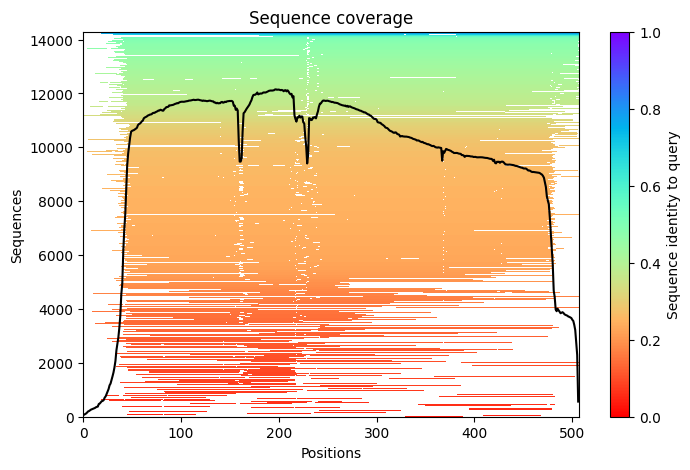

2023-09-11 01:43:35,055 Setting max_seq=16, max_extra_seq=32
2023-09-11 01:44:30,490 alphafold2_ptm_model_1_seed_000 recycle=0 pLDDT=75 pTM=0.763
2023-09-11 01:44:35,375 alphafold2_ptm_model_1_seed_000 recycle=1 pLDDT=79.4 pTM=0.798 tol=1.83
2023-09-11 01:44:40,244 alphafold2_ptm_model_1_seed_000 recycle=2 pLDDT=78.6 pTM=0.782 tol=2.59
2023-09-11 01:44:45,112 alphafold2_ptm_model_1_seed_000 recycle=3 pLDDT=78.9 pTM=0.772 tol=2.19
2023-09-11 01:44:45,113 alphafold2_ptm_model_1_seed_000 took 52.3s (3 recycles)


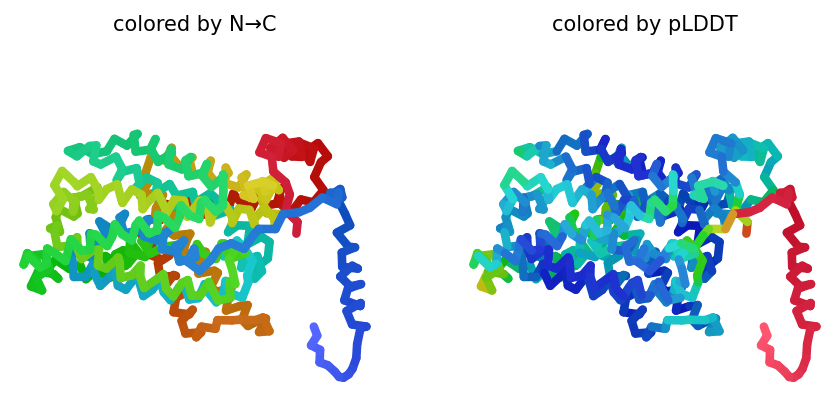

2023-09-11 01:44:50,613 alphafold2_ptm_model_2_seed_000 recycle=0 pLDDT=76.2 pTM=0.765
2023-09-11 01:44:55,521 alphafold2_ptm_model_2_seed_000 recycle=1 pLDDT=81.9 pTM=0.802 tol=1.8
2023-09-11 01:45:00,424 alphafold2_ptm_model_2_seed_000 recycle=2 pLDDT=81.1 pTM=0.792 tol=3.66
2023-09-11 01:45:05,311 alphafold2_ptm_model_2_seed_000 recycle=3 pLDDT=79.9 pTM=0.778 tol=2.21
2023-09-11 01:45:05,313 alphafold2_ptm_model_2_seed_000 took 19.6s (3 recycles)


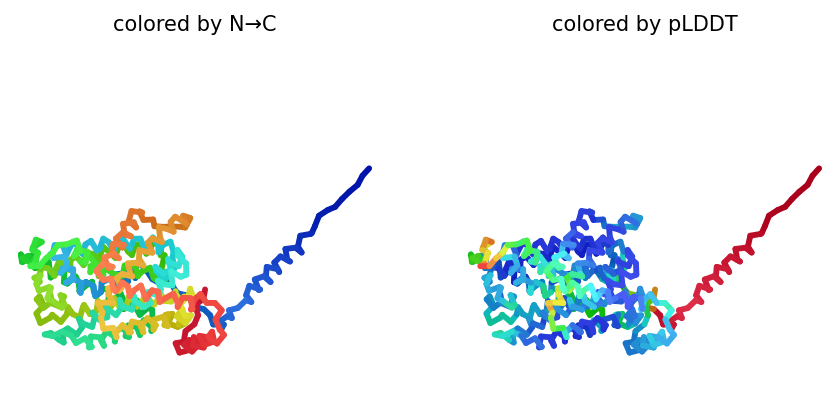

2023-09-11 01:45:10,756 alphafold2_ptm_model_3_seed_000 recycle=0 pLDDT=73 pTM=0.737
2023-09-11 01:45:15,666 alphafold2_ptm_model_3_seed_000 recycle=1 pLDDT=81 pTM=0.799 tol=2.96
2023-09-11 01:45:20,583 alphafold2_ptm_model_3_seed_000 recycle=2 pLDDT=82.4 pTM=0.813 tol=0.793
2023-09-11 01:45:25,491 alphafold2_ptm_model_3_seed_000 recycle=3 pLDDT=82.6 pTM=0.802 tol=1.41
2023-09-11 01:45:25,493 alphafold2_ptm_model_3_seed_000 took 19.6s (3 recycles)


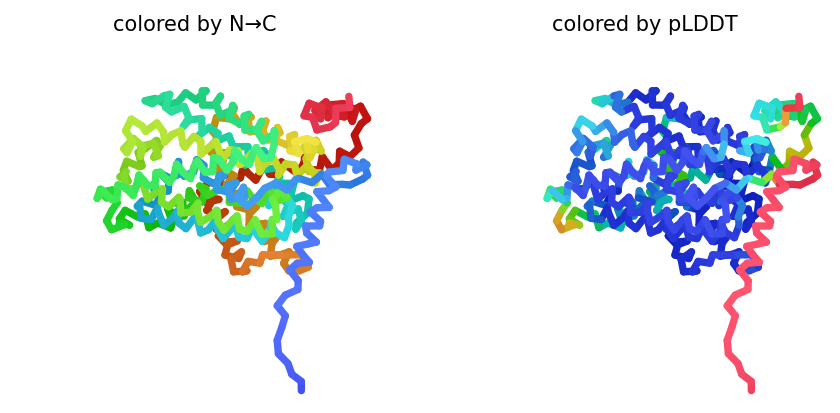

2023-09-11 01:45:30,960 alphafold2_ptm_model_4_seed_000 recycle=0 pLDDT=77.1 pTM=0.771
2023-09-11 01:45:35,886 alphafold2_ptm_model_4_seed_000 recycle=1 pLDDT=83 pTM=0.815 tol=1.99
2023-09-11 01:45:40,755 alphafold2_ptm_model_4_seed_000 recycle=2 pLDDT=73.2 pTM=0.708 tol=3.8
2023-09-11 01:45:45,639 alphafold2_ptm_model_4_seed_000 recycle=3 pLDDT=80.6 pTM=0.781 tol=2.21
2023-09-11 01:45:45,641 alphafold2_ptm_model_4_seed_000 took 19.6s (3 recycles)


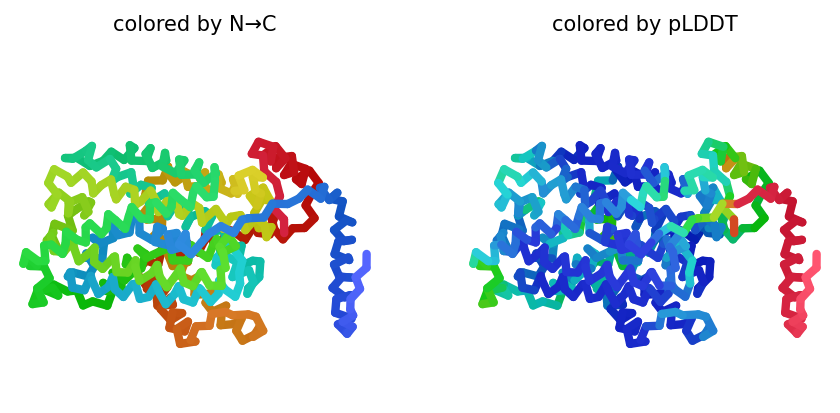

2023-09-11 01:45:51,126 alphafold2_ptm_model_5_seed_000 recycle=0 pLDDT=79.1 pTM=0.793
2023-09-11 01:45:56,075 alphafold2_ptm_model_5_seed_000 recycle=1 pLDDT=83.9 pTM=0.819 tol=2.8
2023-09-11 01:46:01,009 alphafold2_ptm_model_5_seed_000 recycle=2 pLDDT=83.2 pTM=0.813 tol=2.92
2023-09-11 01:46:05,938 alphafold2_ptm_model_5_seed_000 recycle=3 pLDDT=83.6 pTM=0.812 tol=1.25
2023-09-11 01:46:05,940 alphafold2_ptm_model_5_seed_000 took 19.7s (3 recycles)


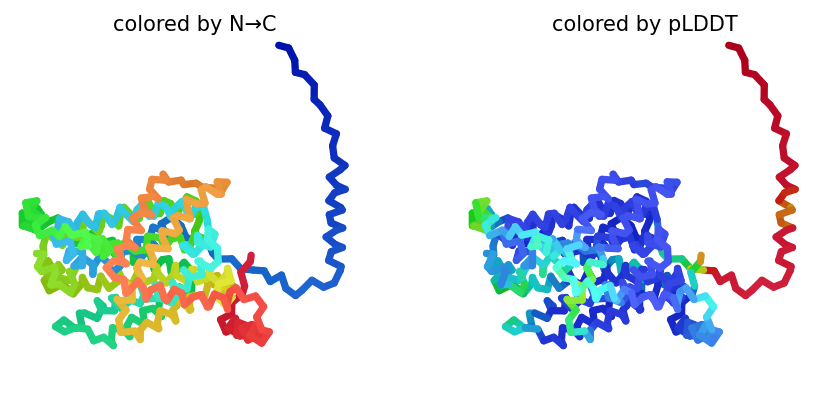

2023-09-11 01:46:15,289 alphafold2_ptm_model_1_seed_001 recycle=0 pLDDT=64.6 pTM=0.667
2023-09-11 01:46:20,182 alphafold2_ptm_model_1_seed_001 recycle=1 pLDDT=79.9 pTM=0.803 tol=3.16
2023-09-11 01:46:25,066 alphafold2_ptm_model_1_seed_001 recycle=2 pLDDT=80.4 pTM=0.806 tol=2.23
2023-09-11 01:46:29,946 alphafold2_ptm_model_1_seed_001 recycle=3 pLDDT=80.9 pTM=0.794 tol=2.37
2023-09-11 01:46:29,948 alphafold2_ptm_model_1_seed_001 took 19.6s (3 recycles)


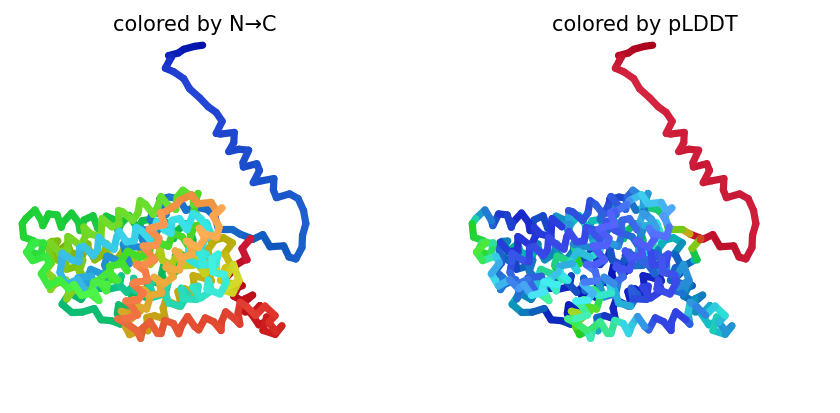

2023-09-11 01:46:35,382 alphafold2_ptm_model_2_seed_001 recycle=0 pLDDT=72.8 pTM=0.753
2023-09-11 01:46:40,291 alphafold2_ptm_model_2_seed_001 recycle=1 pLDDT=81.6 pTM=0.8 tol=3.83
2023-09-11 01:46:45,200 alphafold2_ptm_model_2_seed_001 recycle=2 pLDDT=82 pTM=0.794 tol=1.27
2023-09-11 01:46:50,142 alphafold2_ptm_model_2_seed_001 recycle=3 pLDDT=83.7 pTM=0.811 tol=0.554
2023-09-11 01:46:50,143 alphafold2_ptm_model_2_seed_001 took 19.7s (3 recycles)


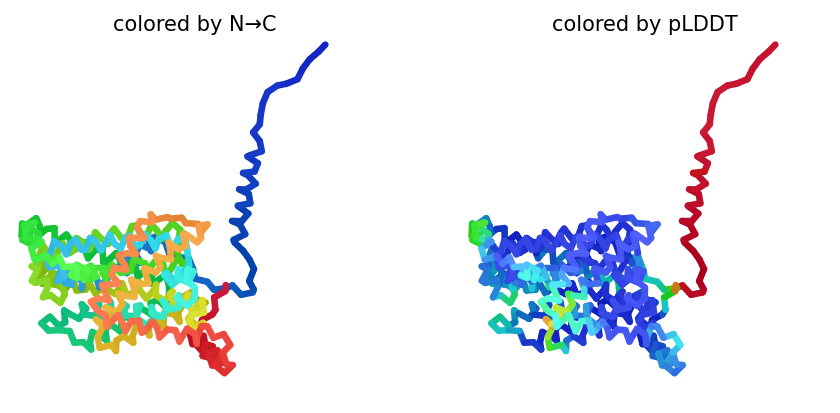

2023-09-11 01:46:55,566 alphafold2_ptm_model_3_seed_001 recycle=0 pLDDT=56.7 pTM=0.57
2023-09-11 01:47:00,445 alphafold2_ptm_model_3_seed_001 recycle=1 pLDDT=77.8 pTM=0.777 tol=4.38
2023-09-11 01:47:05,337 alphafold2_ptm_model_3_seed_001 recycle=2 pLDDT=81.8 pTM=0.8 tol=1.24
2023-09-11 01:47:10,240 alphafold2_ptm_model_3_seed_001 recycle=3 pLDDT=83.4 pTM=0.798 tol=1.32
2023-09-11 01:47:10,241 alphafold2_ptm_model_3_seed_001 took 19.5s (3 recycles)


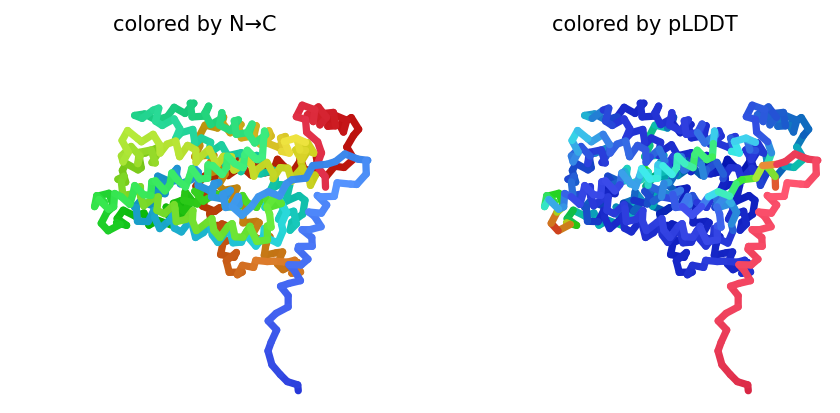

2023-09-11 01:47:15,682 alphafold2_ptm_model_4_seed_001 recycle=0 pLDDT=75.8 pTM=0.771
2023-09-11 01:47:20,629 alphafold2_ptm_model_4_seed_001 recycle=1 pLDDT=83.2 pTM=0.816 tol=2.08
2023-09-11 01:47:25,576 alphafold2_ptm_model_4_seed_001 recycle=2 pLDDT=83.9 pTM=0.821 tol=2.31
2023-09-11 01:47:30,516 alphafold2_ptm_model_4_seed_001 recycle=3 pLDDT=83.9 pTM=0.818 tol=1.87
2023-09-11 01:47:30,517 alphafold2_ptm_model_4_seed_001 took 19.7s (3 recycles)


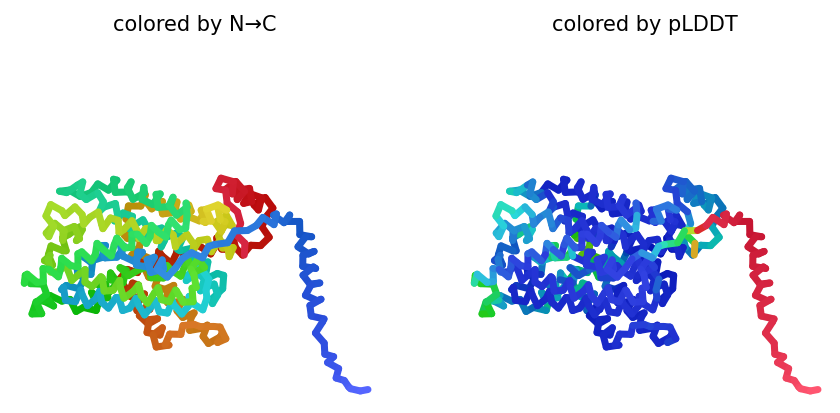

2023-09-11 01:47:35,991 alphafold2_ptm_model_5_seed_001 recycle=0 pLDDT=80.5 pTM=0.807
2023-09-11 01:47:40,943 alphafold2_ptm_model_5_seed_001 recycle=1 pLDDT=83.7 pTM=0.823 tol=2.09
2023-09-11 01:47:45,912 alphafold2_ptm_model_5_seed_001 recycle=2 pLDDT=84.1 pTM=0.829 tol=1.05
2023-09-11 01:47:50,874 alphafold2_ptm_model_5_seed_001 recycle=3 pLDDT=84.3 pTM=0.828 tol=2.74
2023-09-11 01:47:50,876 alphafold2_ptm_model_5_seed_001 took 19.8s (3 recycles)


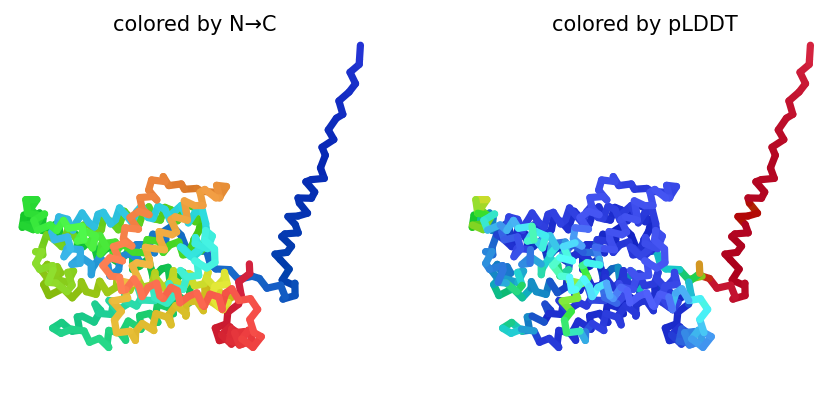

2023-09-11 01:48:00,204 alphafold2_ptm_model_1_seed_002 recycle=0 pLDDT=75.1 pTM=0.76
2023-09-11 01:48:05,113 alphafold2_ptm_model_1_seed_002 recycle=1 pLDDT=81.1 pTM=0.818 tol=2.45
2023-09-11 01:48:10,036 alphafold2_ptm_model_1_seed_002 recycle=2 pLDDT=82.4 pTM=0.823 tol=3.19
2023-09-11 01:48:14,943 alphafold2_ptm_model_1_seed_002 recycle=3 pLDDT=82.8 pTM=0.813 tol=1.81
2023-09-11 01:48:14,944 alphafold2_ptm_model_1_seed_002 took 19.7s (3 recycles)


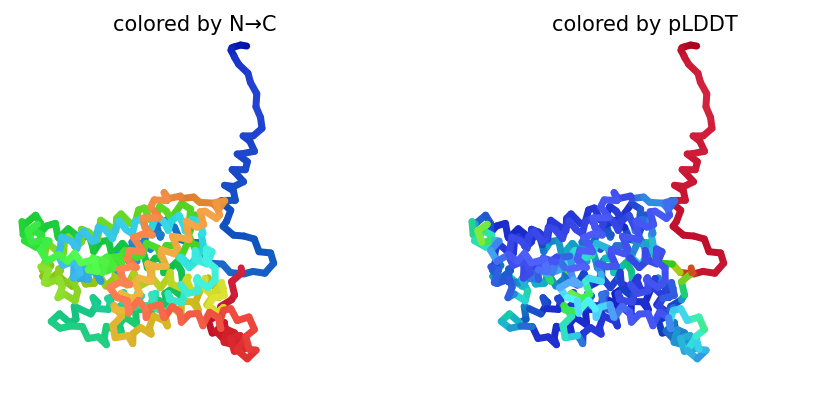

2023-09-11 01:48:20,393 alphafold2_ptm_model_2_seed_002 recycle=0 pLDDT=76.4 pTM=0.777
2023-09-11 01:48:25,331 alphafold2_ptm_model_2_seed_002 recycle=1 pLDDT=82.8 pTM=0.817 tol=1.93
2023-09-11 01:48:30,266 alphafold2_ptm_model_2_seed_002 recycle=2 pLDDT=83.4 pTM=0.812 tol=0.785
2023-09-11 01:48:35,186 alphafold2_ptm_model_2_seed_002 recycle=3 pLDDT=82.8 pTM=0.807 tol=0.455
2023-09-11 01:48:35,187 alphafold2_ptm_model_2_seed_002 took 19.7s (3 recycles)


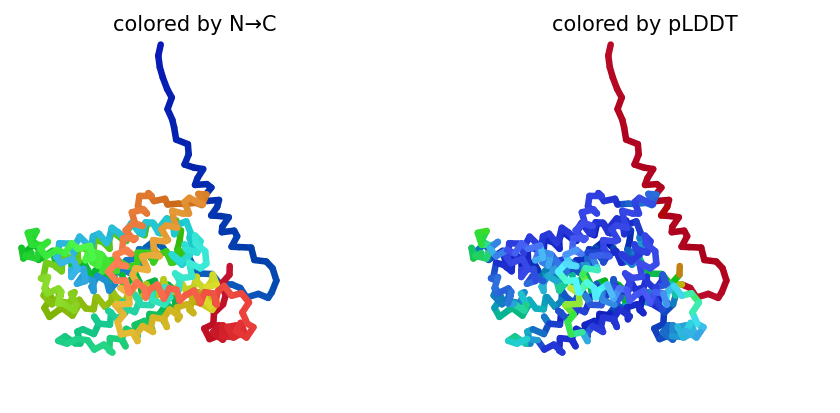

2023-09-11 01:48:40,644 alphafold2_ptm_model_3_seed_002 recycle=0 pLDDT=74.5 pTM=0.749
2023-09-11 01:48:45,549 alphafold2_ptm_model_3_seed_002 recycle=1 pLDDT=79.9 pTM=0.798 tol=2.77
2023-09-11 01:48:50,450 alphafold2_ptm_model_3_seed_002 recycle=2 pLDDT=80.8 pTM=0.795 tol=1.25
2023-09-11 01:48:55,342 alphafold2_ptm_model_3_seed_002 recycle=3 pLDDT=79.4 pTM=0.784 tol=1.53
2023-09-11 01:48:55,343 alphafold2_ptm_model_3_seed_002 took 19.6s (3 recycles)


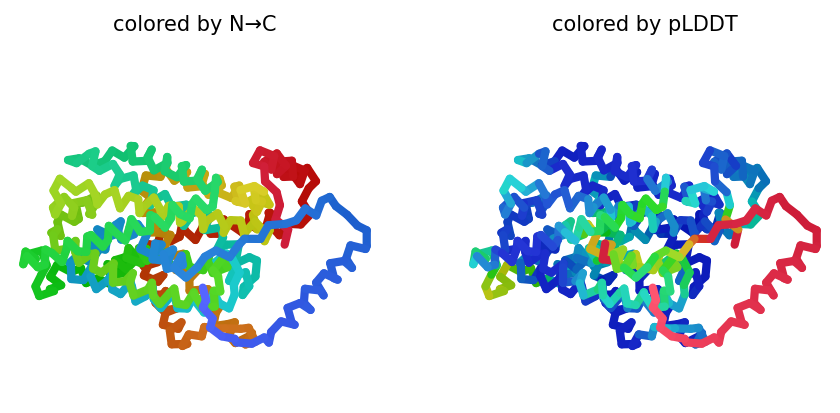

2023-09-11 01:49:00,789 alphafold2_ptm_model_4_seed_002 recycle=0 pLDDT=77.8 pTM=0.78
2023-09-11 01:49:05,699 alphafold2_ptm_model_4_seed_002 recycle=1 pLDDT=82.4 pTM=0.807 tol=2.22
2023-09-11 01:49:10,632 alphafold2_ptm_model_4_seed_002 recycle=2 pLDDT=83.5 pTM=0.815 tol=1.36
2023-09-11 01:49:15,553 alphafold2_ptm_model_4_seed_002 recycle=3 pLDDT=82.9 pTM=0.803 tol=0.924
2023-09-11 01:49:15,555 alphafold2_ptm_model_4_seed_002 took 19.7s (3 recycles)


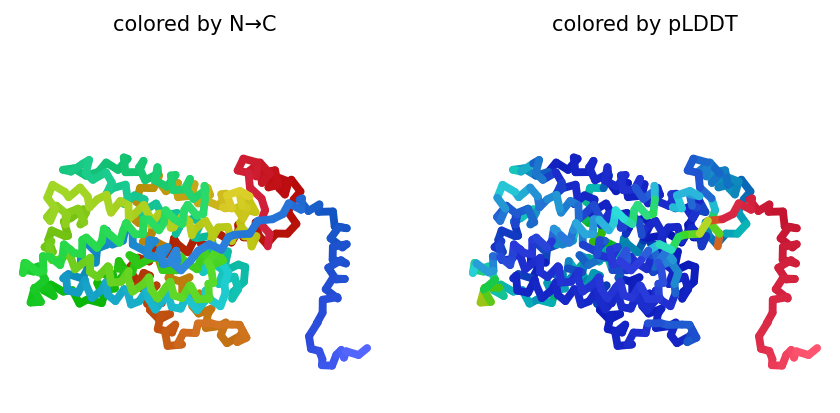

2023-09-11 01:49:21,020 alphafold2_ptm_model_5_seed_002 recycle=0 pLDDT=80.3 pTM=0.783
2023-09-11 01:49:25,962 alphafold2_ptm_model_5_seed_002 recycle=1 pLDDT=83.8 pTM=0.818 tol=2.19
2023-09-11 01:49:30,930 alphafold2_ptm_model_5_seed_002 recycle=2 pLDDT=84.9 pTM=0.823 tol=2.48
2023-09-11 01:49:35,890 alphafold2_ptm_model_5_seed_002 recycle=3 pLDDT=84.6 pTM=0.823 tol=0.848
2023-09-11 01:49:35,894 alphafold2_ptm_model_5_seed_002 took 19.8s (3 recycles)


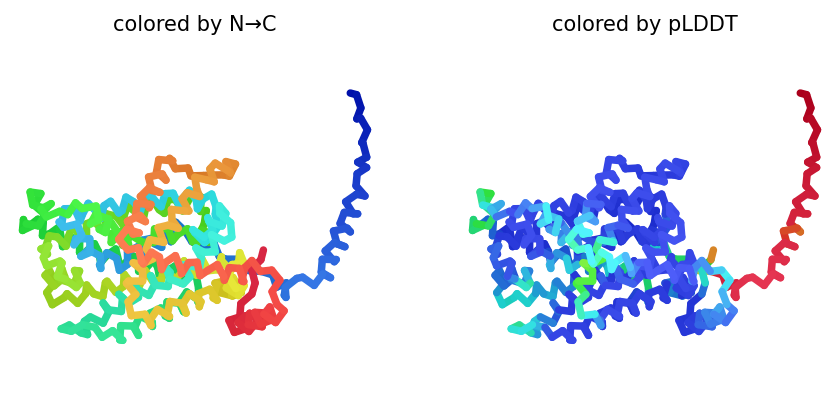

2023-09-11 01:49:45,408 alphafold2_ptm_model_1_seed_003 recycle=0 pLDDT=70.6 pTM=0.705
2023-09-11 01:49:50,284 alphafold2_ptm_model_1_seed_003 recycle=1 pLDDT=80 pTM=0.794 tol=2.08
2023-09-11 01:49:55,146 alphafold2_ptm_model_1_seed_003 recycle=2 pLDDT=82.1 pTM=0.808 tol=1.29
2023-09-11 01:50:00,041 alphafold2_ptm_model_1_seed_003 recycle=3 pLDDT=82.2 pTM=0.807 tol=1.06
2023-09-11 01:50:00,042 alphafold2_ptm_model_1_seed_003 took 19.5s (3 recycles)


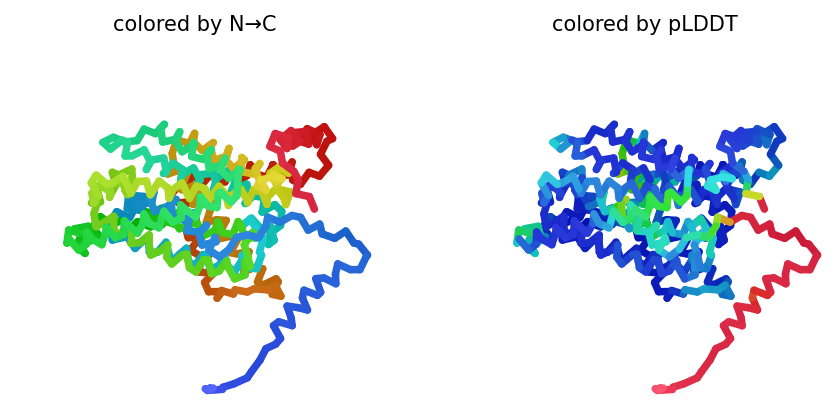

2023-09-11 01:50:05,442 alphafold2_ptm_model_2_seed_003 recycle=0 pLDDT=73.8 pTM=0.745
2023-09-11 01:50:10,346 alphafold2_ptm_model_2_seed_003 recycle=1 pLDDT=81.8 pTM=0.802 tol=3.06
2023-09-11 01:50:15,250 alphafold2_ptm_model_2_seed_003 recycle=2 pLDDT=81.5 pTM=0.804 tol=1.35
2023-09-11 01:50:20,141 alphafold2_ptm_model_2_seed_003 recycle=3 pLDDT=80.8 pTM=0.794 tol=0.641
2023-09-11 01:50:20,142 alphafold2_ptm_model_2_seed_003 took 19.5s (3 recycles)


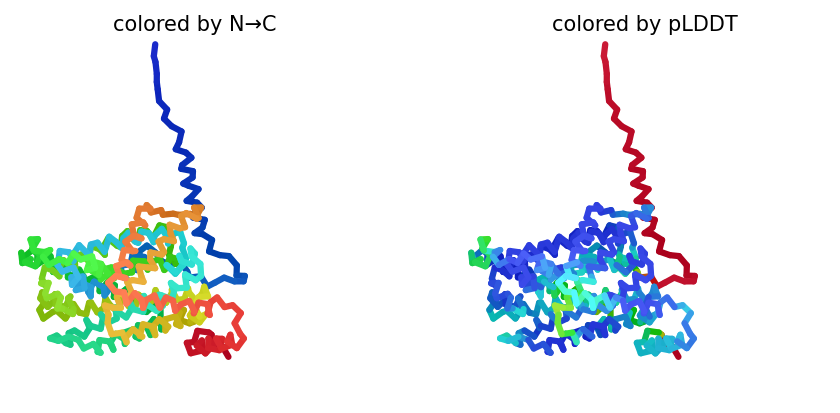

2023-09-11 01:50:25,530 alphafold2_ptm_model_3_seed_003 recycle=0 pLDDT=65.9 pTM=0.653
2023-09-11 01:50:30,428 alphafold2_ptm_model_3_seed_003 recycle=1 pLDDT=80.8 pTM=0.8 tol=4.6
2023-09-11 01:50:35,303 alphafold2_ptm_model_3_seed_003 recycle=2 pLDDT=83.8 pTM=0.815 tol=1.5
2023-09-11 01:50:40,241 alphafold2_ptm_model_3_seed_003 recycle=3 pLDDT=85.6 pTM=0.836 tol=1.02
2023-09-11 01:50:40,242 alphafold2_ptm_model_3_seed_003 took 19.5s (3 recycles)


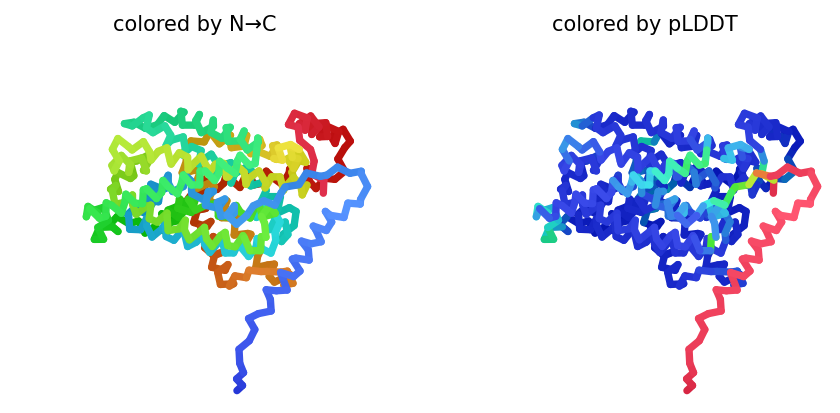

2023-09-11 01:50:45,667 alphafold2_ptm_model_4_seed_003 recycle=0 pLDDT=74.8 pTM=0.749
2023-09-11 01:50:50,589 alphafold2_ptm_model_4_seed_003 recycle=1 pLDDT=83.1 pTM=0.809 tol=5.59
2023-09-11 01:50:55,482 alphafold2_ptm_model_4_seed_003 recycle=2 pLDDT=83.7 pTM=0.812 tol=2.23
2023-09-11 01:51:00,420 alphafold2_ptm_model_4_seed_003 recycle=3 pLDDT=84.2 pTM=0.813 tol=1.28
2023-09-11 01:51:00,421 alphafold2_ptm_model_4_seed_003 took 19.6s (3 recycles)


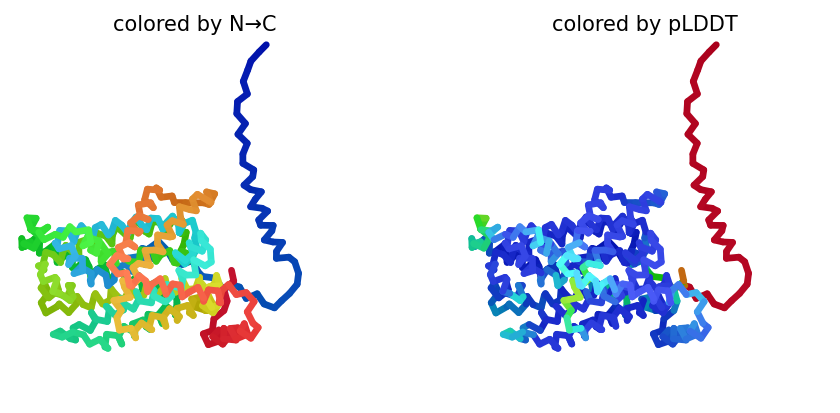

2023-09-11 01:51:05,868 alphafold2_ptm_model_5_seed_003 recycle=0 pLDDT=79.2 pTM=0.792
2023-09-11 01:51:10,802 alphafold2_ptm_model_5_seed_003 recycle=1 pLDDT=84 pTM=0.819 tol=2.22
2023-09-11 01:51:15,706 alphafold2_ptm_model_5_seed_003 recycle=2 pLDDT=83.8 pTM=0.818 tol=2.12
2023-09-11 01:51:20,661 alphafold2_ptm_model_5_seed_003 recycle=3 pLDDT=84.9 pTM=0.823 tol=1.41
2023-09-11 01:51:20,662 alphafold2_ptm_model_5_seed_003 took 19.7s (3 recycles)


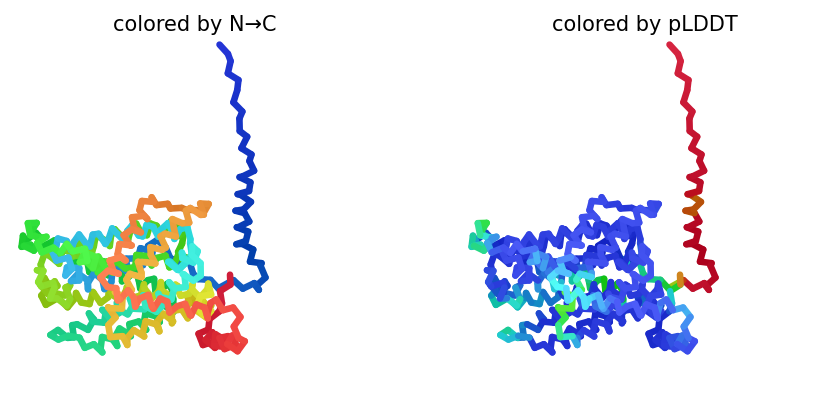

2023-09-11 01:51:29,895 alphafold2_ptm_model_1_seed_004 recycle=0 pLDDT=74.9 pTM=0.755
2023-09-11 01:51:34,719 alphafold2_ptm_model_1_seed_004 recycle=1 pLDDT=74.4 pTM=0.775 tol=3.11
2023-09-11 01:51:39,620 alphafold2_ptm_model_1_seed_004 recycle=2 pLDDT=81.8 pTM=0.812 tol=1.83
2023-09-11 01:51:44,462 alphafold2_ptm_model_1_seed_004 recycle=3 pLDDT=81.2 pTM=0.804 tol=1.61
2023-09-11 01:51:44,463 alphafold2_ptm_model_1_seed_004 took 19.5s (3 recycles)


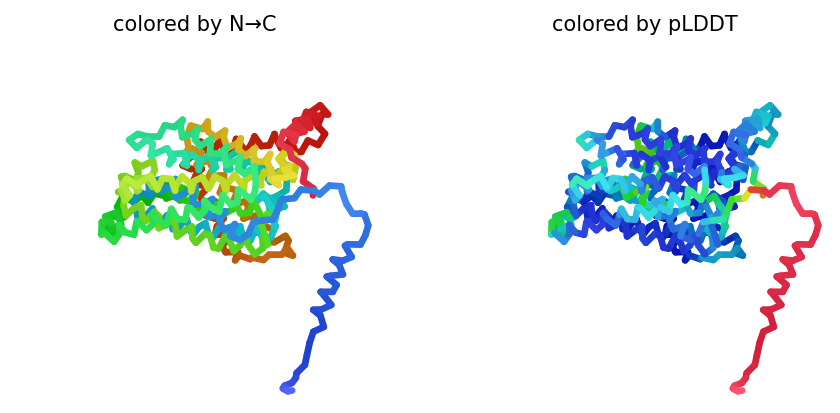

2023-09-11 01:51:49,921 alphafold2_ptm_model_2_seed_004 recycle=0 pLDDT=76.4 pTM=0.772
2023-09-11 01:51:54,817 alphafold2_ptm_model_2_seed_004 recycle=1 pLDDT=82.5 pTM=0.805 tol=2.54
2023-09-11 01:51:59,726 alphafold2_ptm_model_2_seed_004 recycle=2 pLDDT=82.7 pTM=0.803 tol=0.906
2023-09-11 01:52:04,627 alphafold2_ptm_model_2_seed_004 recycle=3 pLDDT=82.8 pTM=0.802 tol=0.285
2023-09-11 01:52:04,628 alphafold2_ptm_model_2_seed_004 took 19.6s (3 recycles)


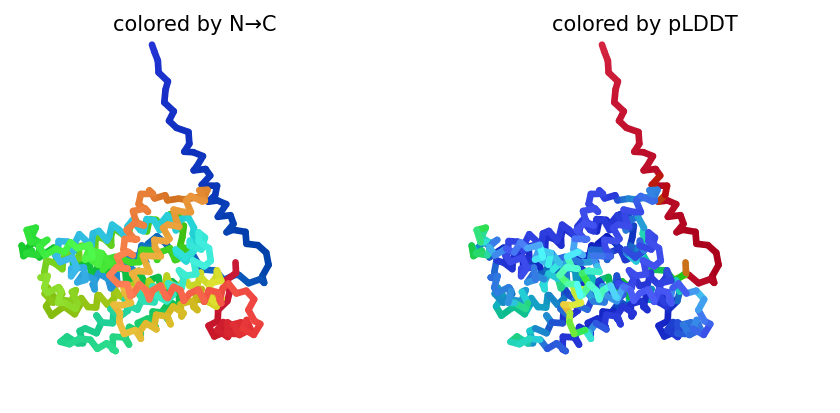

2023-09-11 01:52:10,048 alphafold2_ptm_model_3_seed_004 recycle=0 pLDDT=69.4 pTM=0.705
2023-09-11 01:52:14,938 alphafold2_ptm_model_3_seed_004 recycle=1 pLDDT=80.5 pTM=0.802 tol=3.77
2023-09-11 01:52:19,885 alphafold2_ptm_model_3_seed_004 recycle=2 pLDDT=84.1 pTM=0.818 tol=1.61
2023-09-11 01:52:24,815 alphafold2_ptm_model_3_seed_004 recycle=3 pLDDT=84.6 pTM=0.821 tol=1.35
2023-09-11 01:52:24,816 alphafold2_ptm_model_3_seed_004 took 19.6s (3 recycles)


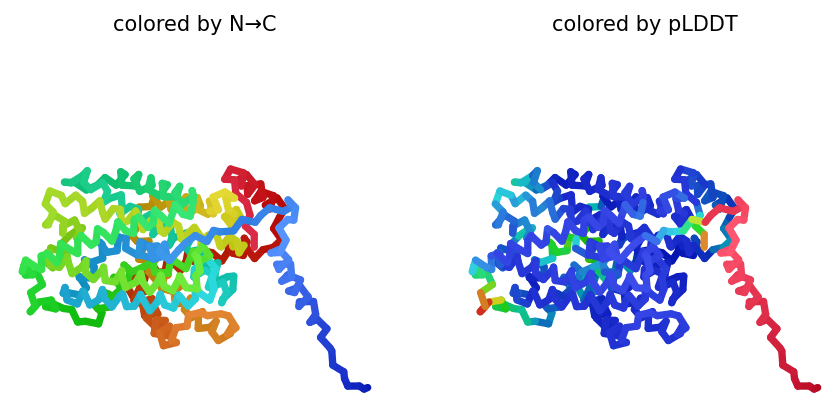

2023-09-11 01:52:30,285 alphafold2_ptm_model_4_seed_004 recycle=0 pLDDT=77.6 pTM=0.789
2023-09-11 01:52:35,162 alphafold2_ptm_model_4_seed_004 recycle=1 pLDDT=78.7 pTM=0.793 tol=2.45
2023-09-11 01:52:40,064 alphafold2_ptm_model_4_seed_004 recycle=2 pLDDT=81.6 pTM=0.795 tol=2.02
2023-09-11 01:52:44,960 alphafold2_ptm_model_4_seed_004 recycle=3 pLDDT=82.5 pTM=0.792 tol=0.999
2023-09-11 01:52:44,961 alphafold2_ptm_model_4_seed_004 took 19.6s (3 recycles)


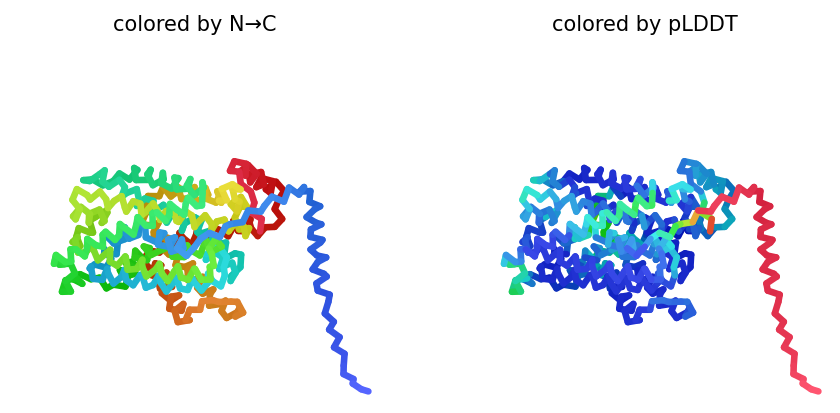

2023-09-11 01:52:50,421 alphafold2_ptm_model_5_seed_004 recycle=0 pLDDT=80.3 pTM=0.805
2023-09-11 01:52:55,344 alphafold2_ptm_model_5_seed_004 recycle=1 pLDDT=83.8 pTM=0.815 tol=3.28
2023-09-11 01:53:00,304 alphafold2_ptm_model_5_seed_004 recycle=2 pLDDT=84.2 pTM=0.821 tol=2.4
2023-09-11 01:53:05,242 alphafold2_ptm_model_5_seed_004 recycle=3 pLDDT=83.8 pTM=0.82 tol=1.19
2023-09-11 01:53:05,244 alphafold2_ptm_model_5_seed_004 took 19.8s (3 recycles)


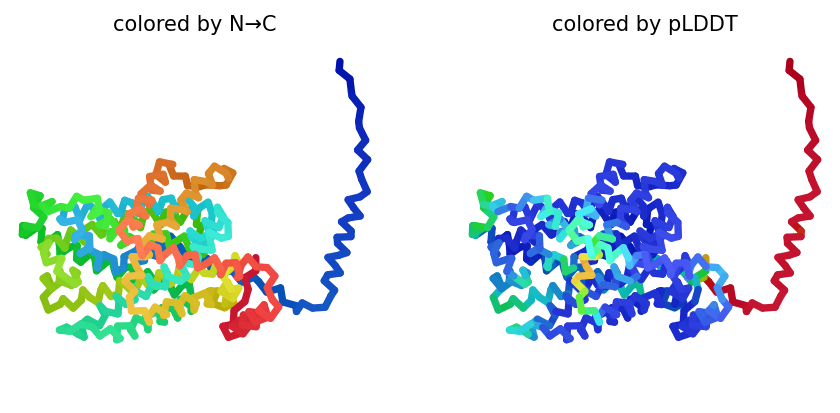

2023-09-11 01:53:14,543 alphafold2_ptm_model_1_seed_005 recycle=0 pLDDT=68.6 pTM=0.697
2023-09-11 01:53:19,435 alphafold2_ptm_model_1_seed_005 recycle=1 pLDDT=79.8 pTM=0.801 tol=2.57
2023-09-11 01:53:24,341 alphafold2_ptm_model_1_seed_005 recycle=2 pLDDT=82.1 pTM=0.811 tol=2.53
2023-09-11 01:53:29,208 alphafold2_ptm_model_1_seed_005 recycle=3 pLDDT=76.8 pTM=0.781 tol=5.54
2023-09-11 01:53:29,210 alphafold2_ptm_model_1_seed_005 took 19.6s (3 recycles)


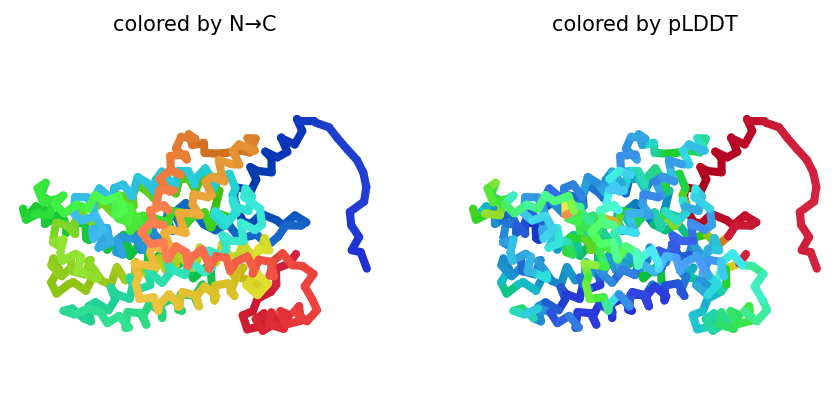

2023-09-11 01:53:34,660 alphafold2_ptm_model_2_seed_005 recycle=0 pLDDT=70.3 pTM=0.727
2023-09-11 01:53:39,556 alphafold2_ptm_model_2_seed_005 recycle=1 pLDDT=81 pTM=0.804 tol=5.19
2023-09-11 01:53:44,471 alphafold2_ptm_model_2_seed_005 recycle=2 pLDDT=81.8 pTM=0.815 tol=0.788
2023-09-11 01:53:49,371 alphafold2_ptm_model_2_seed_005 recycle=3 pLDDT=81.1 pTM=0.803 tol=0.502
2023-09-11 01:53:49,373 alphafold2_ptm_model_2_seed_005 took 19.6s (3 recycles)


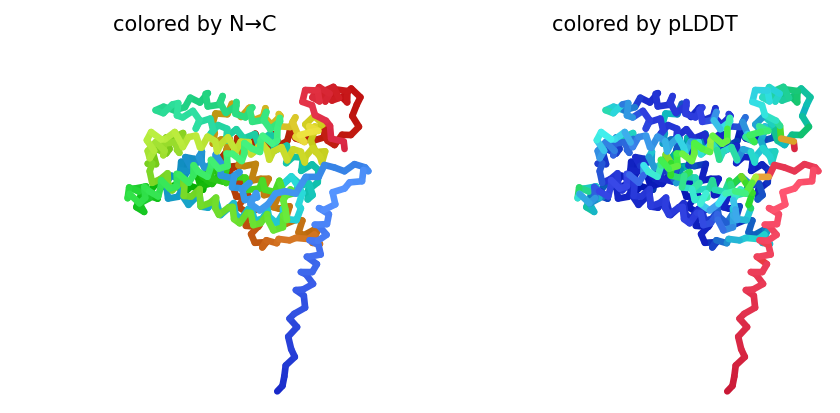

2023-09-11 01:53:54,782 alphafold2_ptm_model_3_seed_005 recycle=0 pLDDT=51.5 pTM=0.509
2023-09-11 01:53:59,678 alphafold2_ptm_model_3_seed_005 recycle=1 pLDDT=80.3 pTM=0.801 tol=6.46
2023-09-11 01:54:04,570 alphafold2_ptm_model_3_seed_005 recycle=2 pLDDT=80.8 pTM=0.802 tol=1.91
2023-09-11 01:54:09,452 alphafold2_ptm_model_3_seed_005 recycle=3 pLDDT=81.3 pTM=0.784 tol=0.886
2023-09-11 01:54:09,454 alphafold2_ptm_model_3_seed_005 took 19.5s (3 recycles)


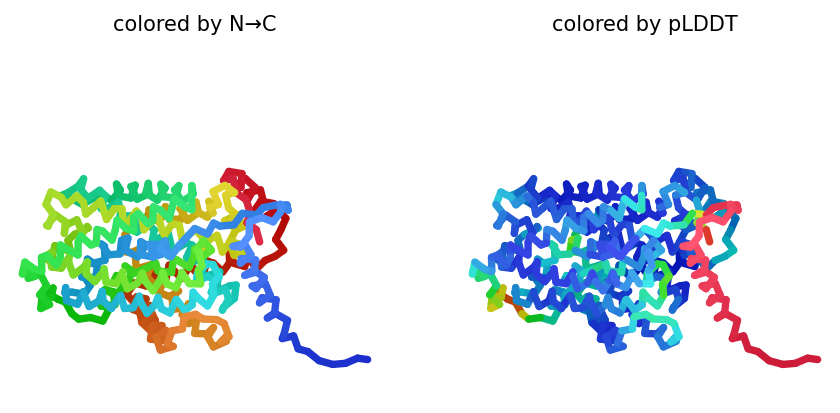

2023-09-11 01:54:14,892 alphafold2_ptm_model_4_seed_005 recycle=0 pLDDT=73.4 pTM=0.762
2023-09-11 01:54:19,775 alphafold2_ptm_model_4_seed_005 recycle=1 pLDDT=80.6 pTM=0.791 tol=3.09
2023-09-11 01:54:24,683 alphafold2_ptm_model_4_seed_005 recycle=2 pLDDT=82.9 pTM=0.806 tol=1.48
2023-09-11 01:54:29,567 alphafold2_ptm_model_4_seed_005 recycle=3 pLDDT=79.9 pTM=0.785 tol=4.12
2023-09-11 01:54:29,569 alphafold2_ptm_model_4_seed_005 took 19.6s (3 recycles)


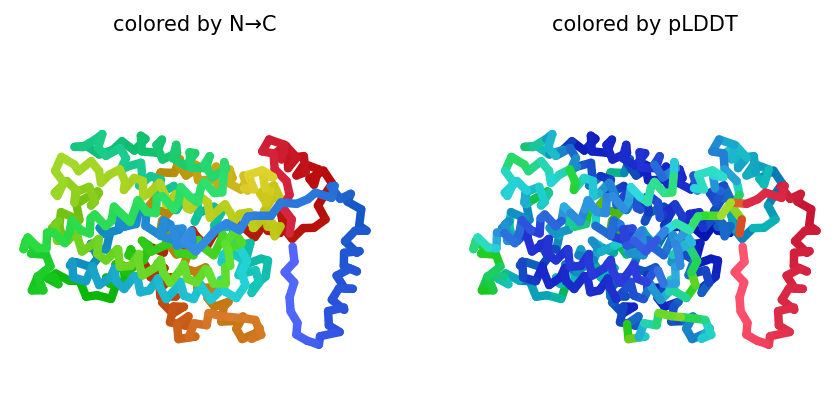

2023-09-11 01:54:35,036 alphafold2_ptm_model_5_seed_005 recycle=0 pLDDT=78.9 pTM=0.793
2023-09-11 01:54:39,944 alphafold2_ptm_model_5_seed_005 recycle=1 pLDDT=81.2 pTM=0.801 tol=2.79
2023-09-11 01:54:44,873 alphafold2_ptm_model_5_seed_005 recycle=2 pLDDT=82.1 pTM=0.805 tol=1.16
2023-09-11 01:54:49,779 alphafold2_ptm_model_5_seed_005 recycle=3 pLDDT=81.6 pTM=0.795 tol=1.06
2023-09-11 01:54:49,781 alphafold2_ptm_model_5_seed_005 took 19.7s (3 recycles)


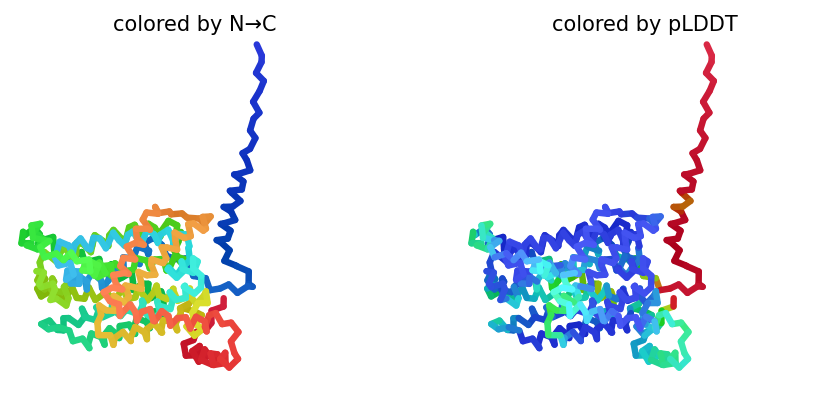

2023-09-11 01:54:58,660 alphafold2_ptm_model_1_seed_006 recycle=0 pLDDT=73.8 pTM=0.744
2023-09-11 01:55:03,567 alphafold2_ptm_model_1_seed_006 recycle=1 pLDDT=81.1 pTM=0.812 tol=1.58
2023-09-11 01:55:08,444 alphafold2_ptm_model_1_seed_006 recycle=2 pLDDT=80.8 pTM=0.795 tol=1.3
2023-09-11 01:55:13,337 alphafold2_ptm_model_1_seed_006 recycle=3 pLDDT=81.7 pTM=0.797 tol=1.25
2023-09-11 01:55:13,339 alphafold2_ptm_model_1_seed_006 took 19.6s (3 recycles)


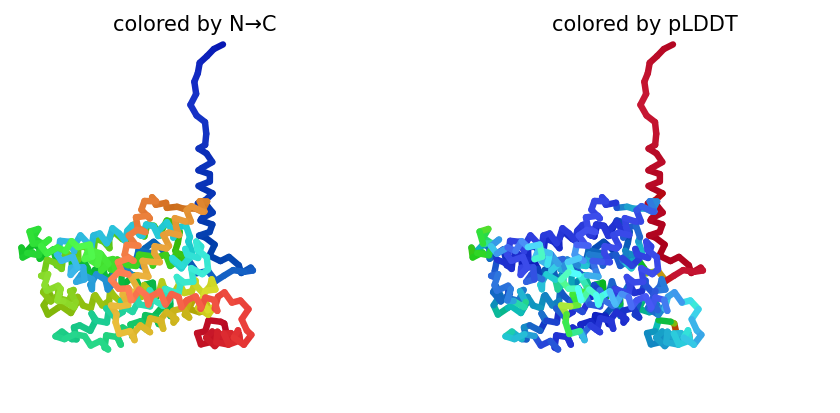

2023-09-11 01:55:19,087 alphafold2_ptm_model_2_seed_006 recycle=0 pLDDT=76 pTM=0.755
2023-09-11 01:55:24,007 alphafold2_ptm_model_2_seed_006 recycle=1 pLDDT=82.6 pTM=0.812 tol=4.63
2023-09-11 01:55:28,868 alphafold2_ptm_model_2_seed_006 recycle=2 pLDDT=82.2 pTM=0.795 tol=1.38
2023-09-11 01:55:33,769 alphafold2_ptm_model_2_seed_006 recycle=3 pLDDT=82 pTM=0.791 tol=1.3
2023-09-11 01:55:33,771 alphafold2_ptm_model_2_seed_006 took 19.5s (3 recycles)


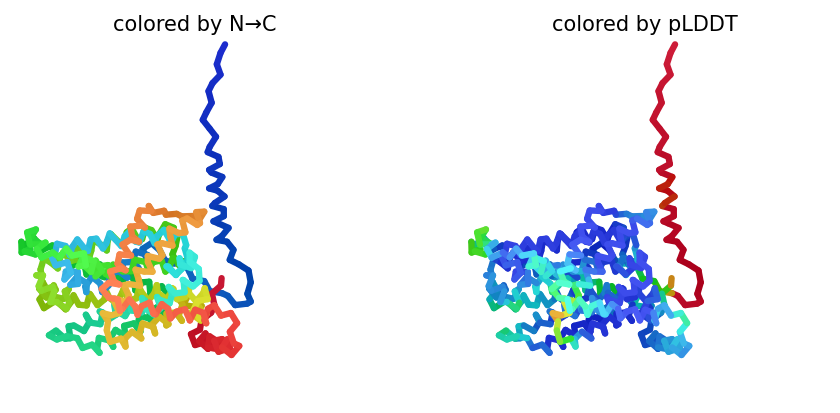

2023-09-11 01:55:39,242 alphafold2_ptm_model_3_seed_006 recycle=0 pLDDT=73.5 pTM=0.743
2023-09-11 01:55:44,088 alphafold2_ptm_model_3_seed_006 recycle=1 pLDDT=77.7 pTM=0.779 tol=3.39
2023-09-11 01:55:48,986 alphafold2_ptm_model_3_seed_006 recycle=2 pLDDT=81.5 pTM=0.793 tol=1.86
2023-09-11 01:55:53,850 alphafold2_ptm_model_3_seed_006 recycle=3 pLDDT=82.8 pTM=0.797 tol=0.488
2023-09-11 01:55:53,851 alphafold2_ptm_model_3_seed_006 took 19.5s (3 recycles)


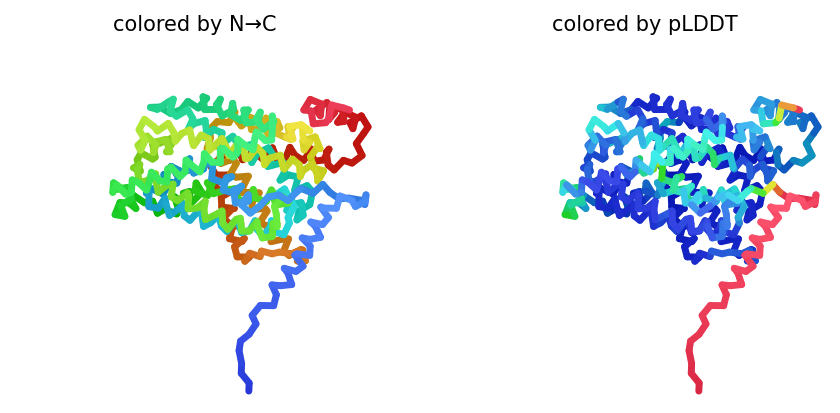

2023-09-11 01:55:59,354 alphafold2_ptm_model_4_seed_006 recycle=0 pLDDT=78.4 pTM=0.771
2023-09-11 01:56:04,223 alphafold2_ptm_model_4_seed_006 recycle=1 pLDDT=81.3 pTM=0.798 tol=1.63
2023-09-11 01:56:09,116 alphafold2_ptm_model_4_seed_006 recycle=2 pLDDT=80.4 pTM=0.781 tol=2.37
2023-09-11 01:56:13,970 alphafold2_ptm_model_4_seed_006 recycle=3 pLDDT=82.1 pTM=0.794 tol=1.1
2023-09-11 01:56:13,971 alphafold2_ptm_model_4_seed_006 took 19.5s (3 recycles)


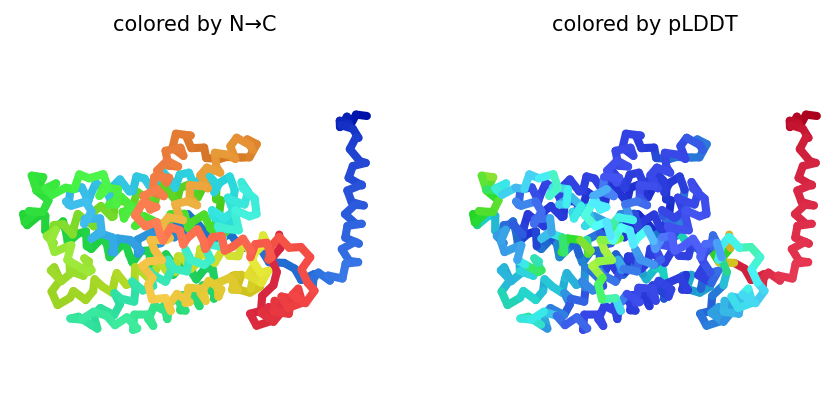

2023-09-11 01:56:19,446 alphafold2_ptm_model_5_seed_006 recycle=0 pLDDT=80.4 pTM=0.771
2023-09-11 01:56:24,360 alphafold2_ptm_model_5_seed_006 recycle=1 pLDDT=83.3 pTM=0.818 tol=6.93
2023-09-11 01:56:29,342 alphafold2_ptm_model_5_seed_006 recycle=2 pLDDT=84.8 pTM=0.832 tol=1.13
2023-09-11 01:56:34,242 alphafold2_ptm_model_5_seed_006 recycle=3 pLDDT=83.9 pTM=0.821 tol=0.665
2023-09-11 01:56:34,243 alphafold2_ptm_model_5_seed_006 took 19.7s (3 recycles)


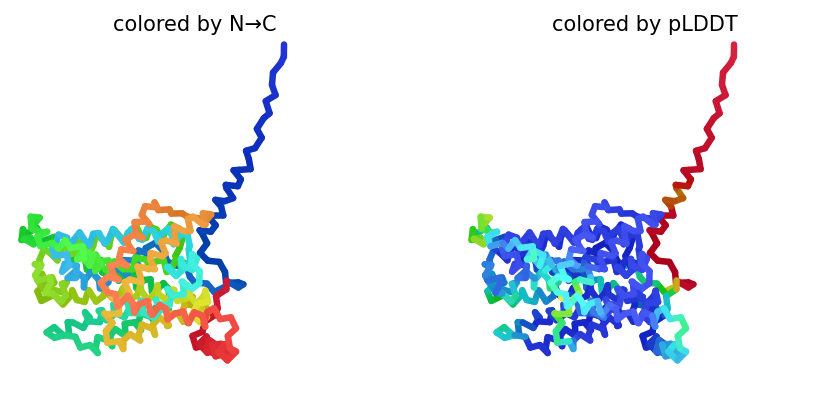

2023-09-11 01:56:43,209 alphafold2_ptm_model_1_seed_007 recycle=0 pLDDT=72.8 pTM=0.724
2023-09-11 01:56:48,098 alphafold2_ptm_model_1_seed_007 recycle=1 pLDDT=79.1 pTM=0.796 tol=2.25
2023-09-11 01:56:52,962 alphafold2_ptm_model_1_seed_007 recycle=2 pLDDT=75.5 pTM=0.768 tol=2.15
2023-09-11 01:56:57,840 alphafold2_ptm_model_1_seed_007 recycle=3 pLDDT=79.4 pTM=0.787 tol=2.49
2023-09-11 01:56:57,841 alphafold2_ptm_model_1_seed_007 took 19.5s (3 recycles)


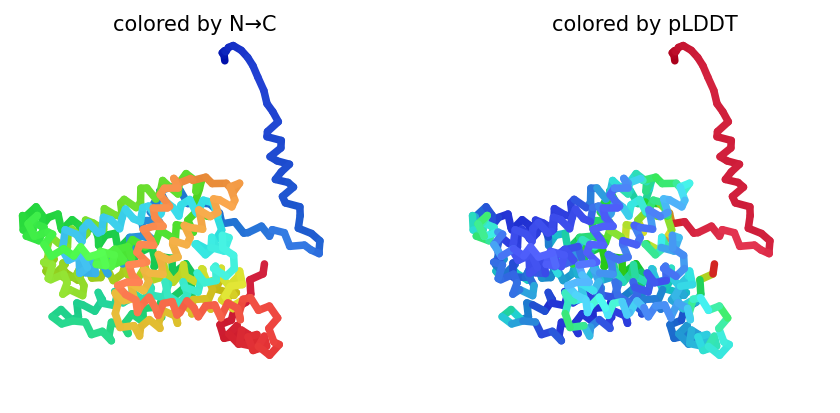

2023-09-11 01:57:03,276 alphafold2_ptm_model_2_seed_007 recycle=0 pLDDT=74.9 pTM=0.742
2023-09-11 01:57:08,172 alphafold2_ptm_model_2_seed_007 recycle=1 pLDDT=79.4 pTM=0.789 tol=2.14
2023-09-11 01:57:13,068 alphafold2_ptm_model_2_seed_007 recycle=2 pLDDT=80.5 pTM=0.804 tol=1.36
2023-09-11 01:57:17,967 alphafold2_ptm_model_2_seed_007 recycle=3 pLDDT=80.6 pTM=0.802 tol=0.453
2023-09-11 01:57:17,968 alphafold2_ptm_model_2_seed_007 took 19.6s (3 recycles)


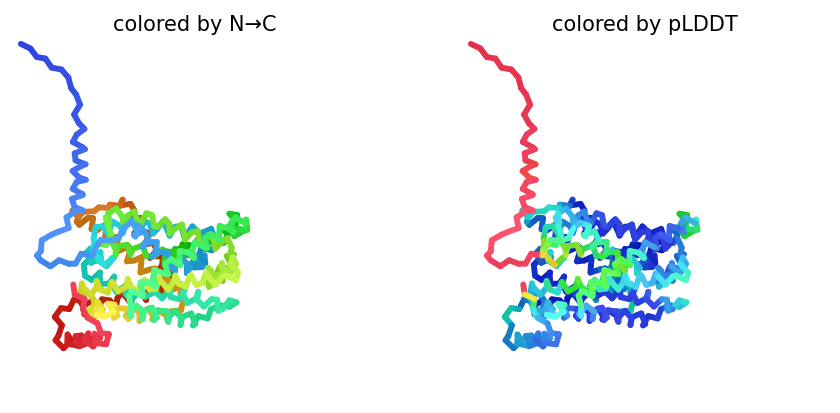

2023-09-11 01:57:23,389 alphafold2_ptm_model_3_seed_007 recycle=0 pLDDT=42.9 pTM=0.716
2023-09-11 01:57:28,245 alphafold2_ptm_model_3_seed_007 recycle=1 pLDDT=41.4 pTM=0.336 tol=8.97
2023-09-11 01:57:33,119 alphafold2_ptm_model_3_seed_007 recycle=2 pLDDT=73.1 pTM=0.726 tol=8.59
2023-09-11 01:57:37,992 alphafold2_ptm_model_3_seed_007 recycle=3 pLDDT=77 pTM=0.751 tol=1.76
2023-09-11 01:57:37,994 alphafold2_ptm_model_3_seed_007 took 19.5s (3 recycles)


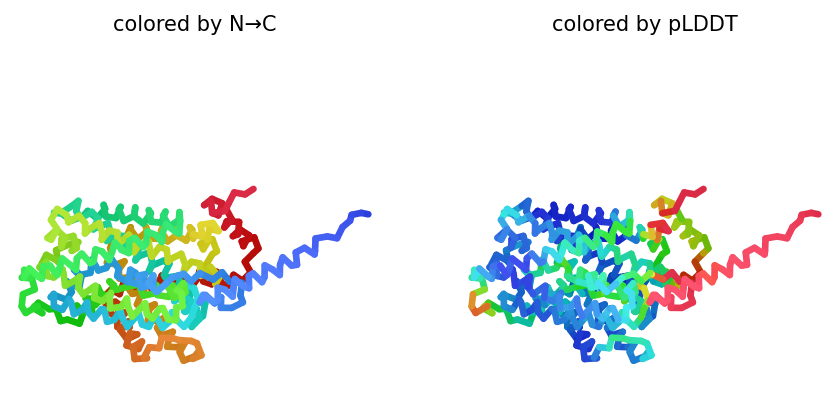

2023-09-11 01:57:43,454 alphafold2_ptm_model_4_seed_007 recycle=0 pLDDT=78.1 pTM=0.779
2023-09-11 01:57:48,334 alphafold2_ptm_model_4_seed_007 recycle=1 pLDDT=78.1 pTM=0.763 tol=2.28
2023-09-11 01:57:53,224 alphafold2_ptm_model_4_seed_007 recycle=2 pLDDT=80.1 pTM=0.779 tol=1.95
2023-09-11 01:57:58,111 alphafold2_ptm_model_4_seed_007 recycle=3 pLDDT=79.9 pTM=0.773 tol=1.36
2023-09-11 01:57:58,113 alphafold2_ptm_model_4_seed_007 took 19.6s (3 recycles)


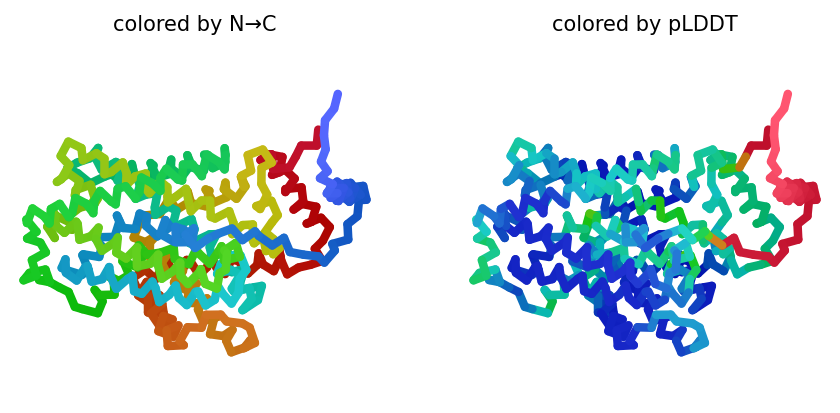

2023-09-11 01:58:03,620 alphafold2_ptm_model_5_seed_007 recycle=0 pLDDT=80.5 pTM=0.806
2023-09-11 01:58:08,545 alphafold2_ptm_model_5_seed_007 recycle=1 pLDDT=81.4 pTM=0.814 tol=1.89
2023-09-11 01:58:13,459 alphafold2_ptm_model_5_seed_007 recycle=2 pLDDT=81.2 pTM=0.809 tol=0.944
2023-09-11 01:58:18,368 alphafold2_ptm_model_5_seed_007 recycle=3 pLDDT=80.9 pTM=0.804 tol=0.934
2023-09-11 01:58:18,370 alphafold2_ptm_model_5_seed_007 took 19.7s (3 recycles)


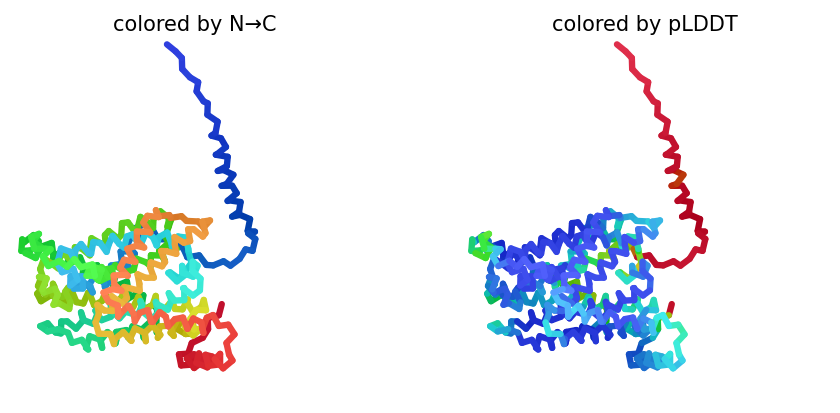

2023-09-11 01:58:27,281 alphafold2_ptm_model_1_seed_008 recycle=0 pLDDT=72 pTM=0.734
2023-09-11 01:58:32,171 alphafold2_ptm_model_1_seed_008 recycle=1 pLDDT=78.9 pTM=0.804 tol=2.93
2023-09-11 01:58:37,070 alphafold2_ptm_model_1_seed_008 recycle=2 pLDDT=80.4 pTM=0.807 tol=1.29
2023-09-11 01:58:41,978 alphafold2_ptm_model_1_seed_008 recycle=3 pLDDT=81.6 pTM=0.809 tol=1.97
2023-09-11 01:58:41,980 alphafold2_ptm_model_1_seed_008 took 19.6s (3 recycles)


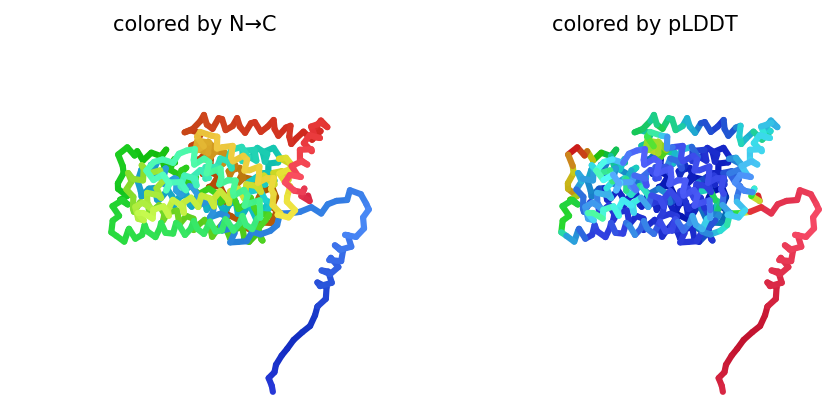

2023-09-11 01:58:47,409 alphafold2_ptm_model_2_seed_008 recycle=0 pLDDT=72.2 pTM=0.736
2023-09-11 01:58:52,324 alphafold2_ptm_model_2_seed_008 recycle=1 pLDDT=81.8 pTM=0.808 tol=2.52
2023-09-11 01:58:57,244 alphafold2_ptm_model_2_seed_008 recycle=2 pLDDT=82.2 pTM=0.808 tol=1.47
2023-09-11 01:59:02,177 alphafold2_ptm_model_2_seed_008 recycle=3 pLDDT=82.9 pTM=0.817 tol=0.707
2023-09-11 01:59:02,178 alphafold2_ptm_model_2_seed_008 took 19.7s (3 recycles)


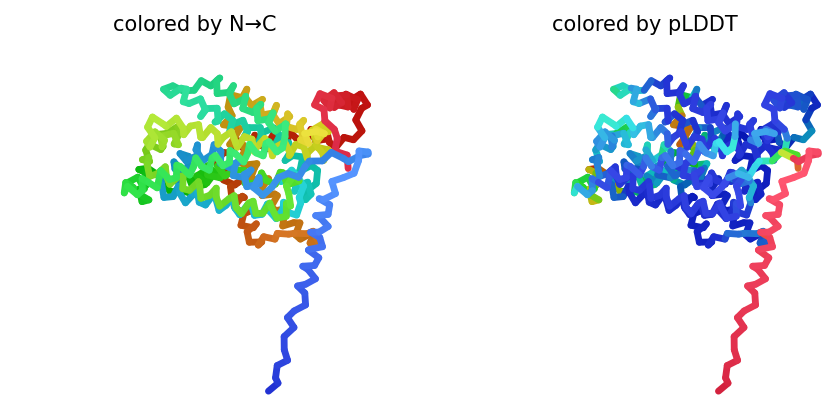

2023-09-11 01:59:07,602 alphafold2_ptm_model_3_seed_008 recycle=0 pLDDT=52.5 pTM=0.522
2023-09-11 01:59:12,489 alphafold2_ptm_model_3_seed_008 recycle=1 pLDDT=76.9 pTM=0.766 tol=3.8
2023-09-11 01:59:17,397 alphafold2_ptm_model_3_seed_008 recycle=2 pLDDT=83.1 pTM=0.815 tol=1.79
2023-09-11 01:59:22,335 alphafold2_ptm_model_3_seed_008 recycle=3 pLDDT=84.5 pTM=0.825 tol=0.583
2023-09-11 01:59:22,336 alphafold2_ptm_model_3_seed_008 took 19.6s (3 recycles)


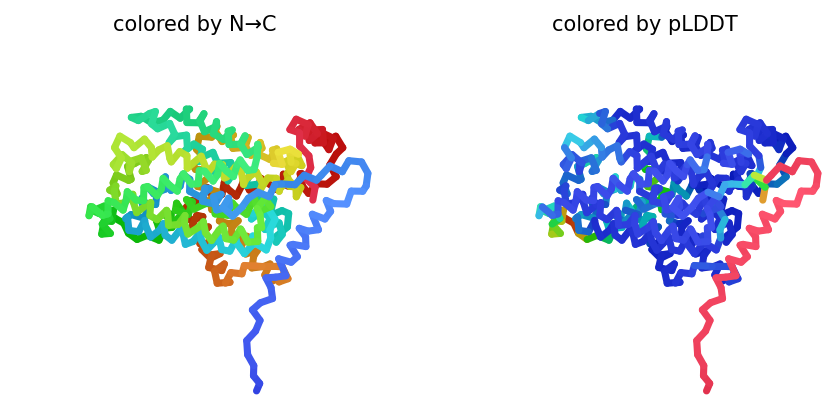

2023-09-11 01:59:27,786 alphafold2_ptm_model_4_seed_008 recycle=0 pLDDT=73.5 pTM=0.75
2023-09-11 01:59:32,721 alphafold2_ptm_model_4_seed_008 recycle=1 pLDDT=82.8 pTM=0.817 tol=3.28
2023-09-11 01:59:37,659 alphafold2_ptm_model_4_seed_008 recycle=2 pLDDT=83.8 pTM=0.813 tol=2.77
2023-09-11 01:59:42,604 alphafold2_ptm_model_4_seed_008 recycle=3 pLDDT=84.4 pTM=0.823 tol=1.97
2023-09-11 01:59:42,606 alphafold2_ptm_model_4_seed_008 took 19.7s (3 recycles)


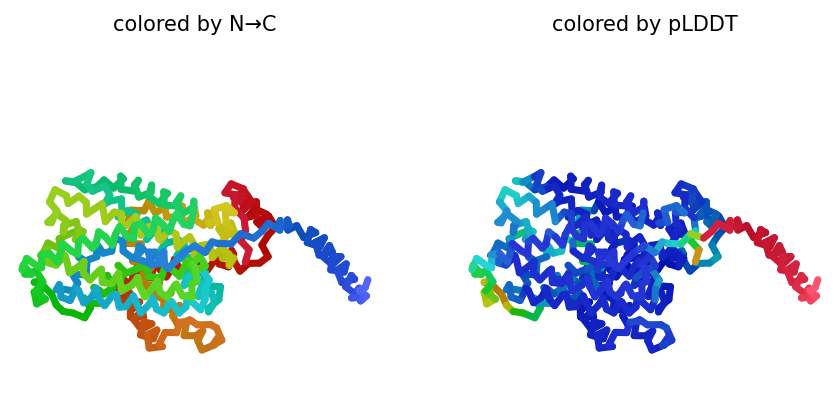

2023-09-11 01:59:48,086 alphafold2_ptm_model_5_seed_008 recycle=0 pLDDT=78.1 pTM=0.773
2023-09-11 01:59:53,071 alphafold2_ptm_model_5_seed_008 recycle=1 pLDDT=84 pTM=0.83 tol=1.83
2023-09-11 01:59:58,052 alphafold2_ptm_model_5_seed_008 recycle=2 pLDDT=84.8 pTM=0.832 tol=2.98
2023-09-11 02:00:03,049 alphafold2_ptm_model_5_seed_008 recycle=3 pLDDT=86 pTM=0.838 tol=2.71
2023-09-11 02:00:03,050 alphafold2_ptm_model_5_seed_008 took 19.9s (3 recycles)


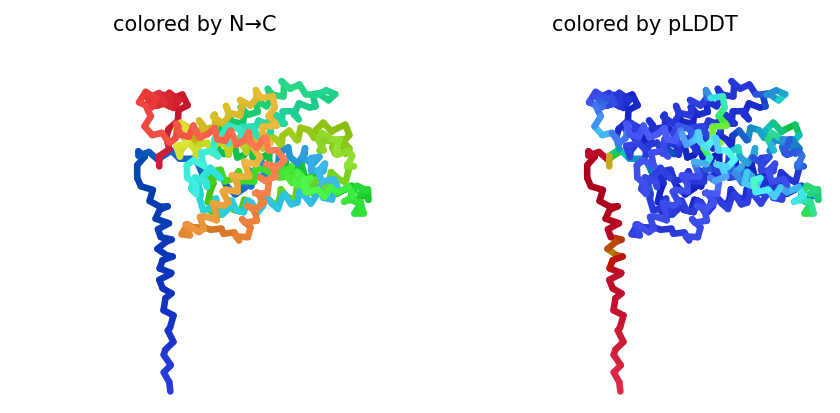

2023-09-11 02:00:11,983 alphafold2_ptm_model_1_seed_009 recycle=0 pLDDT=71.3 pTM=0.717
2023-09-11 02:00:16,869 alphafold2_ptm_model_1_seed_009 recycle=1 pLDDT=80.1 pTM=0.792 tol=2.66
2023-09-11 02:00:21,766 alphafold2_ptm_model_1_seed_009 recycle=2 pLDDT=81.4 pTM=0.807 tol=1.08
2023-09-11 02:00:26,652 alphafold2_ptm_model_1_seed_009 recycle=3 pLDDT=81.2 pTM=0.799 tol=0.993
2023-09-11 02:00:26,654 alphafold2_ptm_model_1_seed_009 took 19.6s (3 recycles)


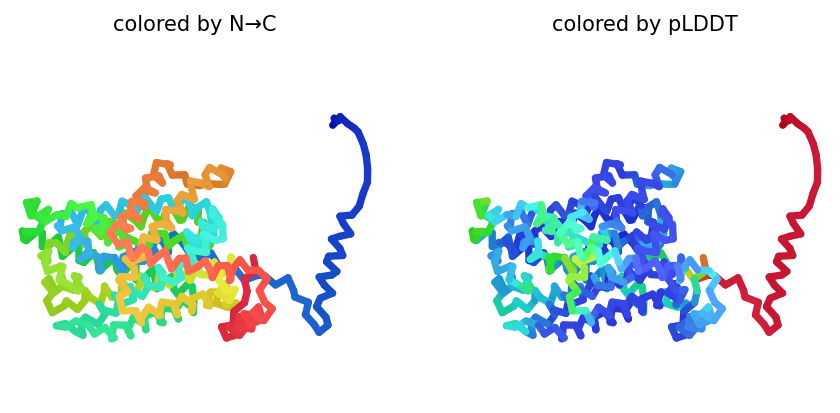

2023-09-11 02:00:32,139 alphafold2_ptm_model_2_seed_009 recycle=0 pLDDT=73.9 pTM=0.751
2023-09-11 02:00:37,055 alphafold2_ptm_model_2_seed_009 recycle=1 pLDDT=80.6 pTM=0.8 tol=1.95
2023-09-11 02:00:41,953 alphafold2_ptm_model_2_seed_009 recycle=2 pLDDT=80.7 pTM=0.795 tol=1.88
2023-09-11 02:00:46,842 alphafold2_ptm_model_2_seed_009 recycle=3 pLDDT=80.1 pTM=0.792 tol=0.771
2023-09-11 02:00:46,843 alphafold2_ptm_model_2_seed_009 took 19.6s (3 recycles)


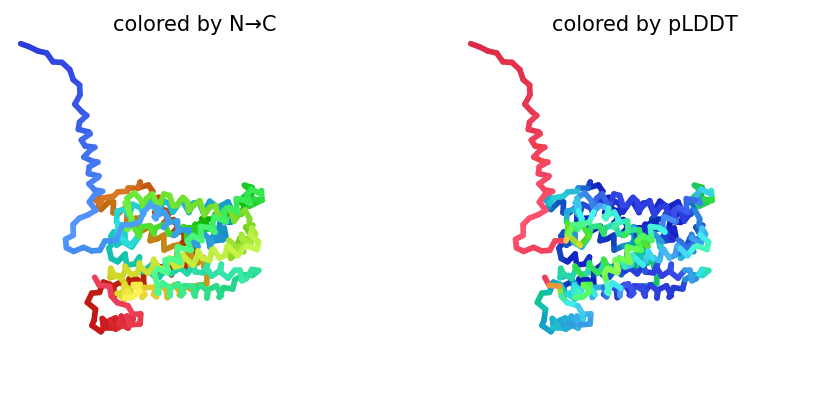

2023-09-11 02:00:52,273 alphafold2_ptm_model_3_seed_009 recycle=0 pLDDT=53.5 pTM=0.569
2023-09-11 02:00:57,163 alphafold2_ptm_model_3_seed_009 recycle=1 pLDDT=77.1 pTM=0.766 tol=4.83
2023-09-11 02:01:02,048 alphafold2_ptm_model_3_seed_009 recycle=2 pLDDT=79.8 pTM=0.782 tol=1.62
2023-09-11 02:01:06,934 alphafold2_ptm_model_3_seed_009 recycle=3 pLDDT=79.9 pTM=0.794 tol=1.17
2023-09-11 02:01:06,935 alphafold2_ptm_model_3_seed_009 took 19.5s (3 recycles)


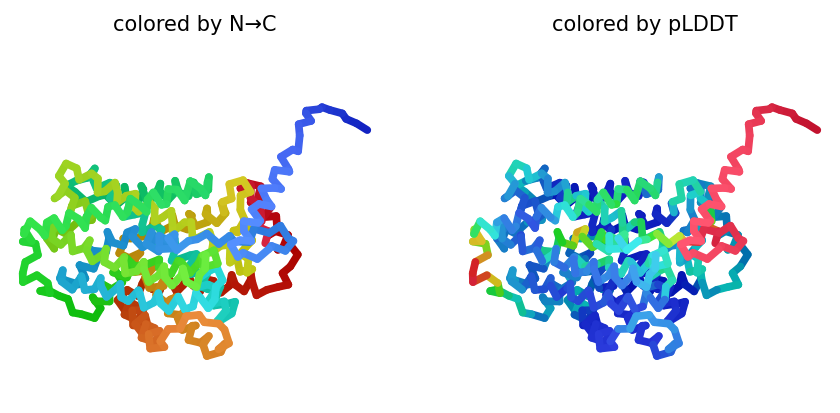

2023-09-11 02:01:12,390 alphafold2_ptm_model_4_seed_009 recycle=0 pLDDT=74.7 pTM=0.761
2023-09-11 02:01:17,301 alphafold2_ptm_model_4_seed_009 recycle=1 pLDDT=81.5 pTM=0.806 tol=2.8
2023-09-11 02:01:22,226 alphafold2_ptm_model_4_seed_009 recycle=2 pLDDT=82.8 pTM=0.804 tol=1.31
2023-09-11 02:01:27,124 alphafold2_ptm_model_4_seed_009 recycle=3 pLDDT=81.7 pTM=0.791 tol=0.559
2023-09-11 02:01:27,126 alphafold2_ptm_model_4_seed_009 took 19.6s (3 recycles)


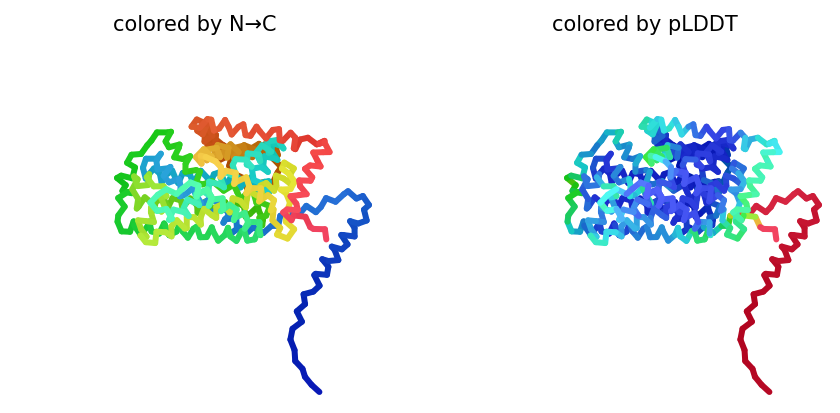

2023-09-11 02:01:32,860 alphafold2_ptm_model_5_seed_009 recycle=0 pLDDT=78.5 pTM=0.789
2023-09-11 02:01:37,812 alphafold2_ptm_model_5_seed_009 recycle=1 pLDDT=83.4 pTM=0.824 tol=4.15
2023-09-11 02:01:42,707 alphafold2_ptm_model_5_seed_009 recycle=2 pLDDT=83.7 pTM=0.817 tol=2.05
2023-09-11 02:01:47,631 alphafold2_ptm_model_5_seed_009 recycle=3 pLDDT=82.9 pTM=0.811 tol=1.46
2023-09-11 02:01:47,632 alphafold2_ptm_model_5_seed_009 took 19.6s (3 recycles)


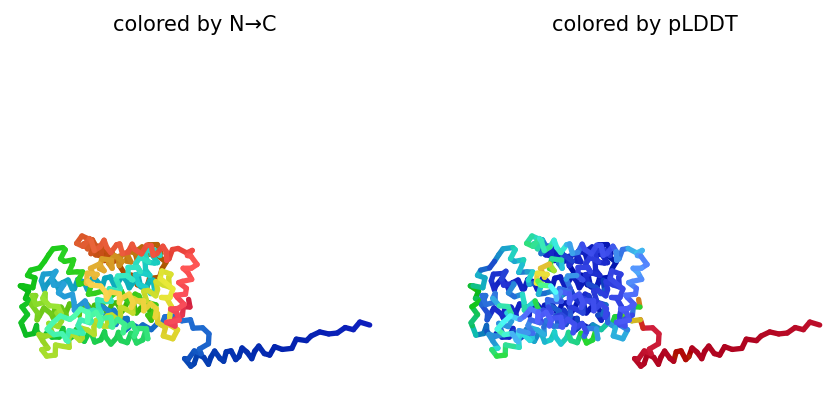

2023-09-11 02:01:56,478 alphafold2_ptm_model_1_seed_010 recycle=0 pLDDT=61.6 pTM=0.63
2023-09-11 02:02:01,340 alphafold2_ptm_model_1_seed_010 recycle=1 pLDDT=75.8 pTM=0.776 tol=5.3
2023-09-11 02:02:06,223 alphafold2_ptm_model_1_seed_010 recycle=2 pLDDT=80.4 pTM=0.814 tol=1.99
2023-09-11 02:02:11,129 alphafold2_ptm_model_1_seed_010 recycle=3 pLDDT=81.8 pTM=0.822 tol=1.44
2023-09-11 02:02:11,131 alphafold2_ptm_model_1_seed_010 took 19.5s (3 recycles)


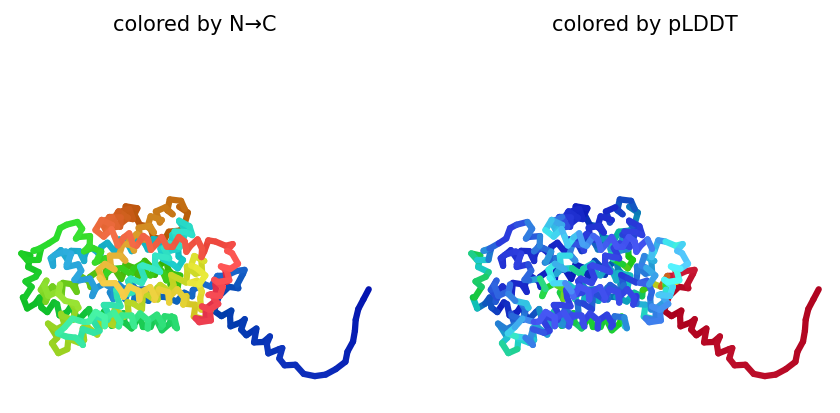

2023-09-11 02:02:16,566 alphafold2_ptm_model_2_seed_010 recycle=0 pLDDT=69.9 pTM=0.731
2023-09-11 02:02:21,469 alphafold2_ptm_model_2_seed_010 recycle=1 pLDDT=81.4 pTM=0.794 tol=4.79
2023-09-11 02:02:26,387 alphafold2_ptm_model_2_seed_010 recycle=2 pLDDT=82.4 pTM=0.796 tol=1.45
2023-09-11 02:02:31,309 alphafold2_ptm_model_2_seed_010 recycle=3 pLDDT=83.1 pTM=0.803 tol=0.762
2023-09-11 02:02:31,310 alphafold2_ptm_model_2_seed_010 took 19.6s (3 recycles)


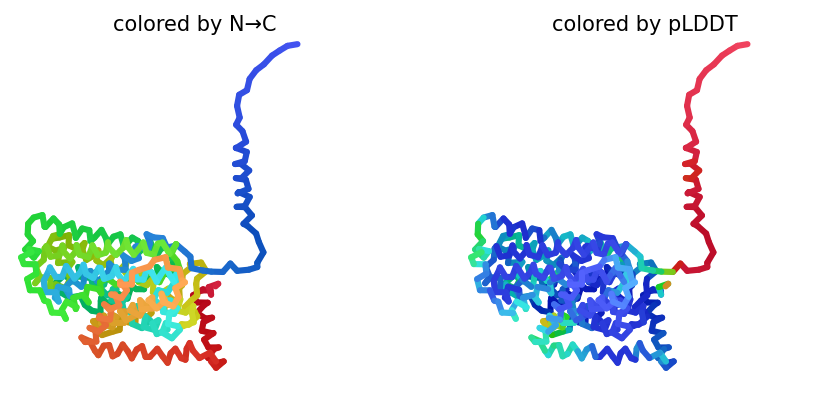

2023-09-11 02:02:36,724 alphafold2_ptm_model_3_seed_010 recycle=0 pLDDT=62.8 pTM=0.631
2023-09-11 02:02:41,603 alphafold2_ptm_model_3_seed_010 recycle=1 pLDDT=78.2 pTM=0.782 tol=5.5
2023-09-11 02:02:46,482 alphafold2_ptm_model_3_seed_010 recycle=2 pLDDT=77.2 pTM=0.76 tol=2.05
2023-09-11 02:02:51,391 alphafold2_ptm_model_3_seed_010 recycle=3 pLDDT=83.1 pTM=0.799 tol=1.68
2023-09-11 02:02:51,393 alphafold2_ptm_model_3_seed_010 took 19.5s (3 recycles)


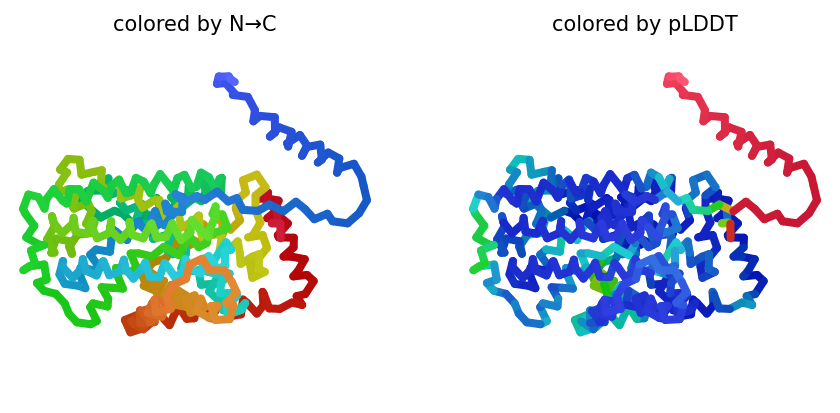

2023-09-11 02:02:56,841 alphafold2_ptm_model_4_seed_010 recycle=0 pLDDT=76 pTM=0.773
2023-09-11 02:03:01,767 alphafold2_ptm_model_4_seed_010 recycle=1 pLDDT=83 pTM=0.816 tol=2.74
2023-09-11 02:03:06,680 alphafold2_ptm_model_4_seed_010 recycle=2 pLDDT=82.9 pTM=0.808 tol=2.12
2023-09-11 02:03:11,613 alphafold2_ptm_model_4_seed_010 recycle=3 pLDDT=84.1 pTM=0.821 tol=1.12
2023-09-11 02:03:11,614 alphafold2_ptm_model_4_seed_010 took 19.7s (3 recycles)


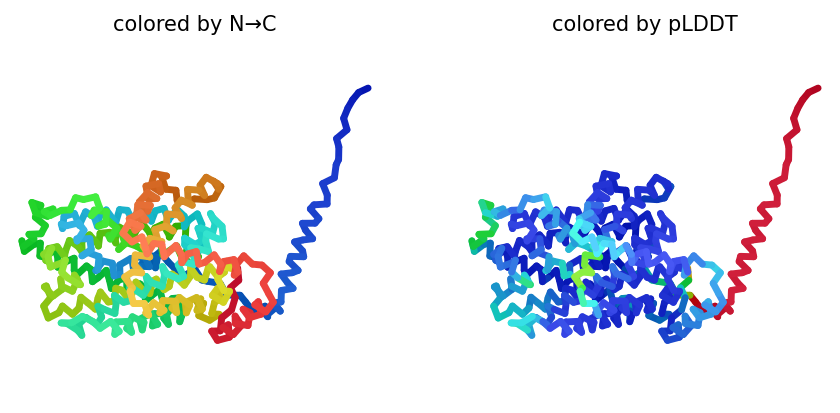

2023-09-11 02:03:17,082 alphafold2_ptm_model_5_seed_010 recycle=0 pLDDT=78.7 pTM=0.784
2023-09-11 02:03:22,028 alphafold2_ptm_model_5_seed_010 recycle=1 pLDDT=83.5 pTM=0.819 tol=2.64
2023-09-11 02:03:26,957 alphafold2_ptm_model_5_seed_010 recycle=2 pLDDT=83 pTM=0.815 tol=3.22
2023-09-11 02:03:31,897 alphafold2_ptm_model_5_seed_010 recycle=3 pLDDT=83.8 pTM=0.82 tol=3.14
2023-09-11 02:03:31,899 alphafold2_ptm_model_5_seed_010 took 19.7s (3 recycles)


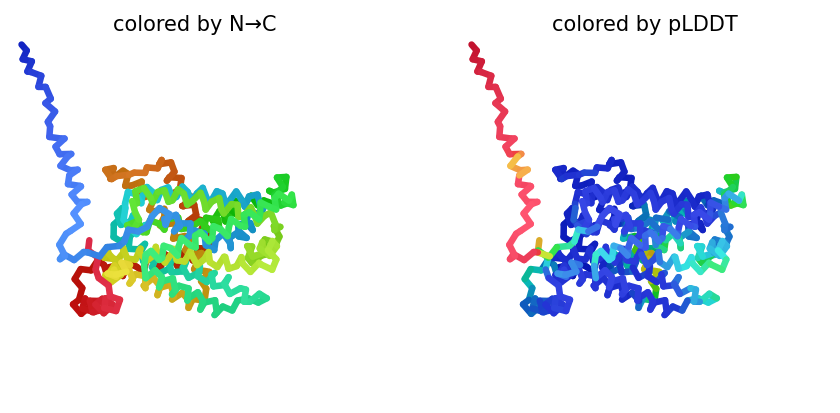

2023-09-11 02:03:40,816 alphafold2_ptm_model_1_seed_011 recycle=0 pLDDT=64.2 pTM=0.643
2023-09-11 02:03:45,710 alphafold2_ptm_model_1_seed_011 recycle=1 pLDDT=79 pTM=0.804 tol=3.22
2023-09-11 02:03:50,618 alphafold2_ptm_model_1_seed_011 recycle=2 pLDDT=81.5 pTM=0.81 tol=2.04
2023-09-11 02:03:55,515 alphafold2_ptm_model_1_seed_011 recycle=3 pLDDT=82.3 pTM=0.807 tol=1.35
2023-09-11 02:03:55,517 alphafold2_ptm_model_1_seed_011 took 19.6s (3 recycles)


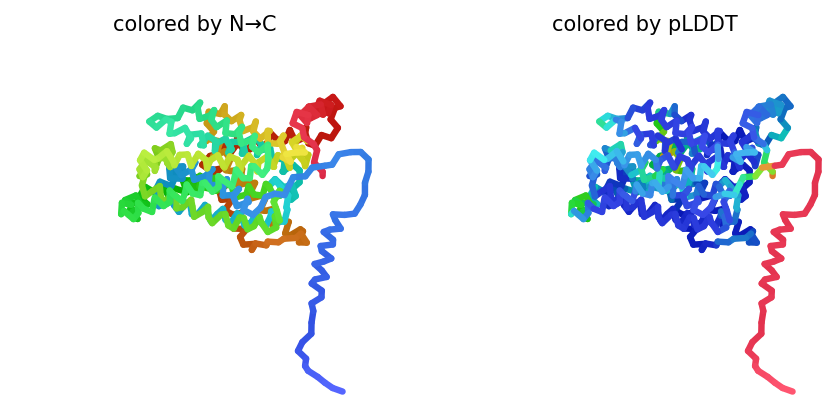

2023-09-11 02:04:00,945 alphafold2_ptm_model_2_seed_011 recycle=0 pLDDT=70.4 pTM=0.723
2023-09-11 02:04:05,873 alphafold2_ptm_model_2_seed_011 recycle=1 pLDDT=82.6 pTM=0.823 tol=1.55
2023-09-11 02:04:10,783 alphafold2_ptm_model_2_seed_011 recycle=2 pLDDT=82.2 pTM=0.803 tol=1.39
2023-09-11 02:04:15,683 alphafold2_ptm_model_2_seed_011 recycle=3 pLDDT=81.3 pTM=0.793 tol=0.721
2023-09-11 02:04:15,685 alphafold2_ptm_model_2_seed_011 took 19.6s (3 recycles)


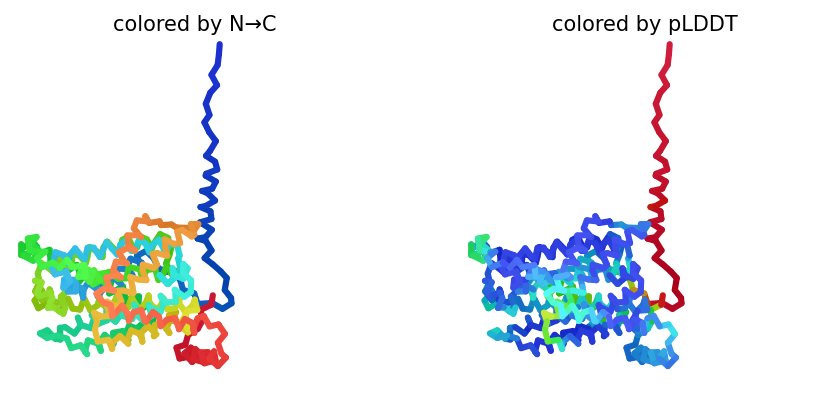

2023-09-11 02:04:21,136 alphafold2_ptm_model_3_seed_011 recycle=0 pLDDT=41.5 pTM=0.261
2023-09-11 02:04:26,042 alphafold2_ptm_model_3_seed_011 recycle=1 pLDDT=78 pTM=0.783 tol=10.7
2023-09-11 02:04:30,953 alphafold2_ptm_model_3_seed_011 recycle=2 pLDDT=82.2 pTM=0.812 tol=2.36
2023-09-11 02:04:35,877 alphafold2_ptm_model_3_seed_011 recycle=3 pLDDT=83.5 pTM=0.818 tol=0.908
2023-09-11 02:04:35,879 alphafold2_ptm_model_3_seed_011 took 19.6s (3 recycles)


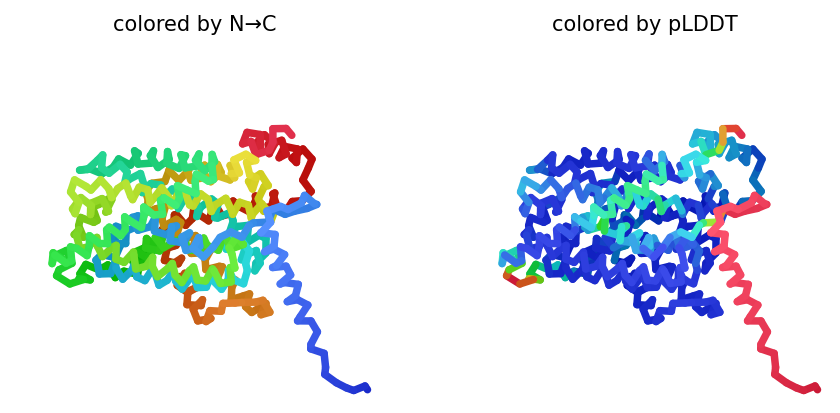

2023-09-11 02:04:41,328 alphafold2_ptm_model_4_seed_011 recycle=0 pLDDT=71.8 pTM=0.725
2023-09-11 02:04:46,245 alphafold2_ptm_model_4_seed_011 recycle=1 pLDDT=81.4 pTM=0.818 tol=2.13
2023-09-11 02:04:51,160 alphafold2_ptm_model_4_seed_011 recycle=2 pLDDT=82.3 pTM=0.818 tol=1.24
2023-09-11 02:04:56,072 alphafold2_ptm_model_4_seed_011 recycle=3 pLDDT=82.2 pTM=0.809 tol=0.906
2023-09-11 02:04:56,073 alphafold2_ptm_model_4_seed_011 took 19.6s (3 recycles)


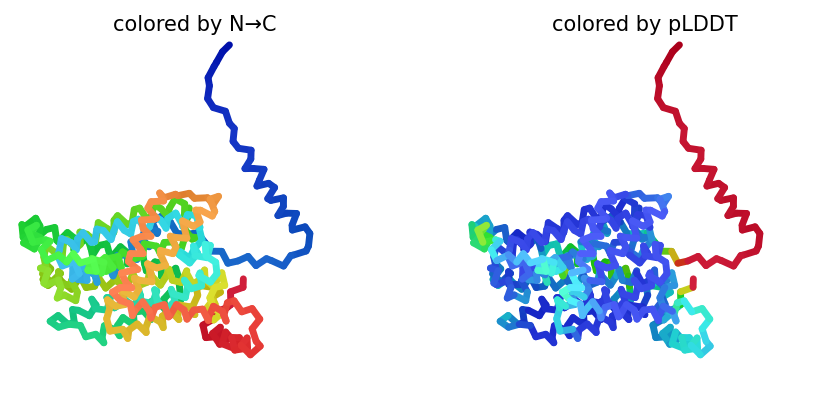

2023-09-11 02:05:01,554 alphafold2_ptm_model_5_seed_011 recycle=0 pLDDT=78.3 pTM=0.789
2023-09-11 02:05:06,506 alphafold2_ptm_model_5_seed_011 recycle=1 pLDDT=83.4 pTM=0.824 tol=2.09
2023-09-11 02:05:11,454 alphafold2_ptm_model_5_seed_011 recycle=2 pLDDT=83.7 pTM=0.823 tol=1.46
2023-09-11 02:05:16,415 alphafold2_ptm_model_5_seed_011 recycle=3 pLDDT=84.2 pTM=0.828 tol=1.5
2023-09-11 02:05:16,417 alphafold2_ptm_model_5_seed_011 took 19.8s (3 recycles)


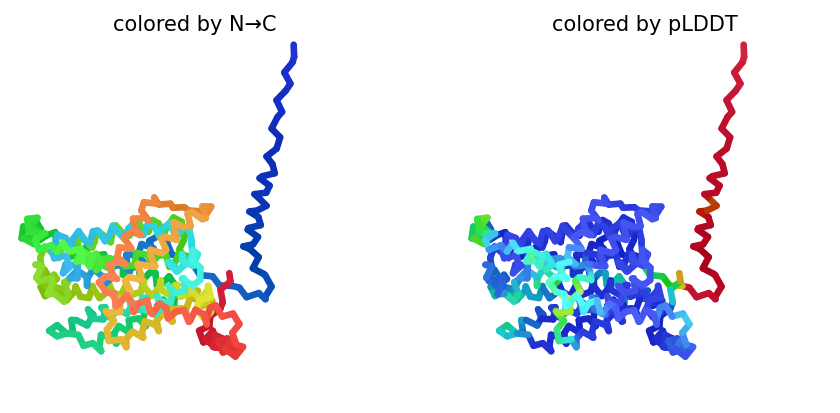

2023-09-11 02:05:25,330 alphafold2_ptm_model_1_seed_012 recycle=0 pLDDT=76.1 pTM=0.762
2023-09-11 02:05:30,221 alphafold2_ptm_model_1_seed_012 recycle=1 pLDDT=78.9 pTM=0.783 tol=2.87
2023-09-11 02:05:35,089 alphafold2_ptm_model_1_seed_012 recycle=2 pLDDT=76.8 pTM=0.755 tol=1.18
2023-09-11 02:05:39,965 alphafold2_ptm_model_1_seed_012 recycle=3 pLDDT=76.2 pTM=0.756 tol=1.25
2023-09-11 02:05:39,966 alphafold2_ptm_model_1_seed_012 took 19.5s (3 recycles)


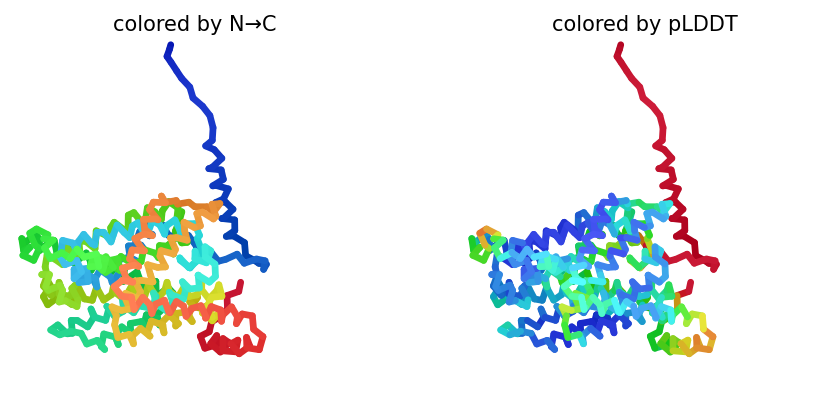

2023-09-11 02:05:45,432 alphafold2_ptm_model_2_seed_012 recycle=0 pLDDT=76.8 pTM=0.783
2023-09-11 02:05:50,324 alphafold2_ptm_model_2_seed_012 recycle=1 pLDDT=79.1 pTM=0.786 tol=1.5
2023-09-11 02:05:55,214 alphafold2_ptm_model_2_seed_012 recycle=2 pLDDT=79.4 pTM=0.781 tol=0.685
2023-09-11 02:06:00,108 alphafold2_ptm_model_2_seed_012 recycle=3 pLDDT=80.8 pTM=0.793 tol=1.8
2023-09-11 02:06:00,109 alphafold2_ptm_model_2_seed_012 took 19.6s (3 recycles)


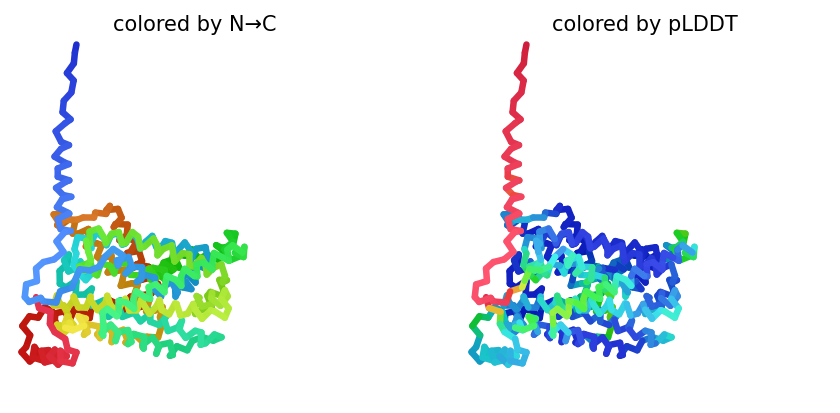

2023-09-11 02:06:05,555 alphafold2_ptm_model_3_seed_012 recycle=0 pLDDT=72.8 pTM=0.732
2023-09-11 02:06:10,459 alphafold2_ptm_model_3_seed_012 recycle=1 pLDDT=78.6 pTM=0.777 tol=2.55
2023-09-11 02:06:15,353 alphafold2_ptm_model_3_seed_012 recycle=2 pLDDT=78.5 pTM=0.771 tol=3.2
2023-09-11 02:06:20,228 alphafold2_ptm_model_3_seed_012 recycle=3 pLDDT=77 pTM=0.773 tol=1.8
2023-09-11 02:06:20,230 alphafold2_ptm_model_3_seed_012 took 19.6s (3 recycles)


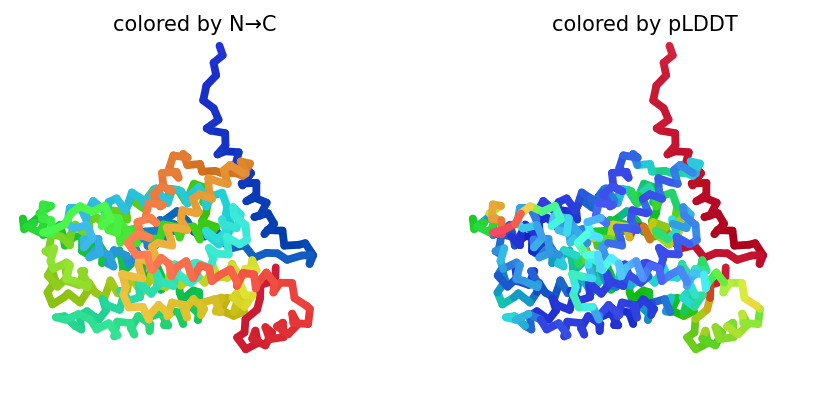

2023-09-11 02:06:25,691 alphafold2_ptm_model_4_seed_012 recycle=0 pLDDT=77.4 pTM=0.765
2023-09-11 02:06:30,600 alphafold2_ptm_model_4_seed_012 recycle=1 pLDDT=80.1 pTM=0.781 tol=1.89
2023-09-11 02:06:35,515 alphafold2_ptm_model_4_seed_012 recycle=2 pLDDT=81.6 pTM=0.794 tol=2.15
2023-09-11 02:06:40,443 alphafold2_ptm_model_4_seed_012 recycle=3 pLDDT=82.5 pTM=0.796 tol=0.578
2023-09-11 02:06:40,444 alphafold2_ptm_model_4_seed_012 took 19.7s (3 recycles)


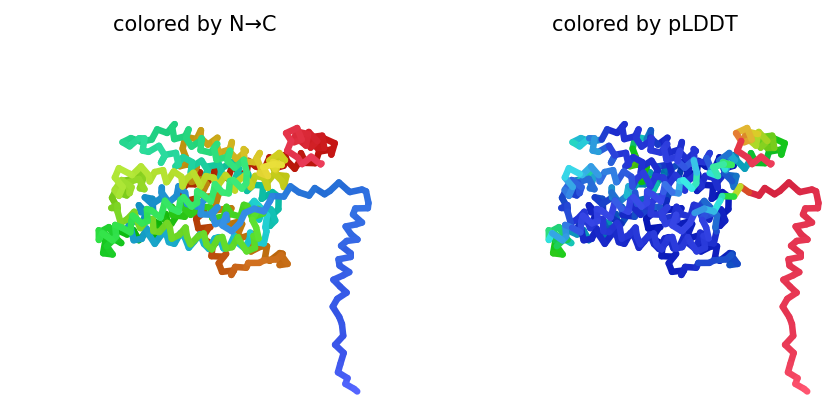

2023-09-11 02:06:45,939 alphafold2_ptm_model_5_seed_012 recycle=0 pLDDT=79.2 pTM=0.788
2023-09-11 02:06:50,841 alphafold2_ptm_model_5_seed_012 recycle=1 pLDDT=78.8 pTM=0.776 tol=1.78
2023-09-11 02:06:55,742 alphafold2_ptm_model_5_seed_012 recycle=2 pLDDT=80.9 pTM=0.803 tol=2.48
2023-09-11 02:07:00,654 alphafold2_ptm_model_5_seed_012 recycle=3 pLDDT=81.1 pTM=0.792 tol=0.82
2023-09-11 02:07:00,655 alphafold2_ptm_model_5_seed_012 took 19.7s (3 recycles)


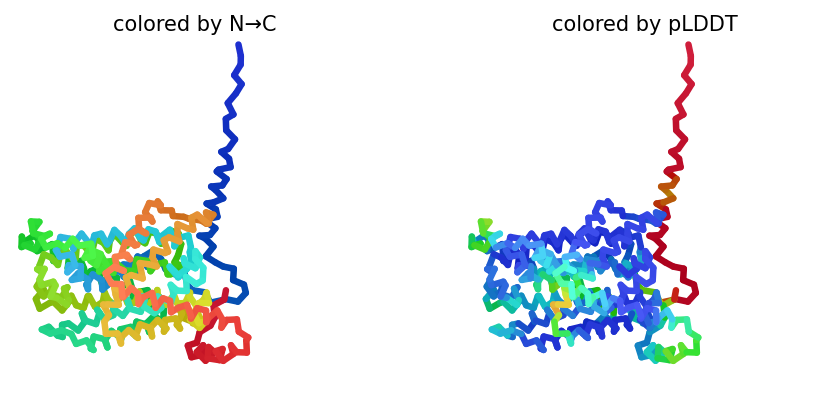

2023-09-11 02:07:09,828 alphafold2_ptm_model_1_seed_013 recycle=0 pLDDT=74 pTM=0.751
2023-09-11 02:07:14,718 alphafold2_ptm_model_1_seed_013 recycle=1 pLDDT=81.6 pTM=0.807 tol=2.81
2023-09-11 02:07:19,575 alphafold2_ptm_model_1_seed_013 recycle=2 pLDDT=82.8 pTM=0.801 tol=3.54
2023-09-11 02:07:24,474 alphafold2_ptm_model_1_seed_013 recycle=3 pLDDT=82.6 pTM=0.802 tol=2.26
2023-09-11 02:07:24,476 alphafold2_ptm_model_1_seed_013 took 19.5s (3 recycles)


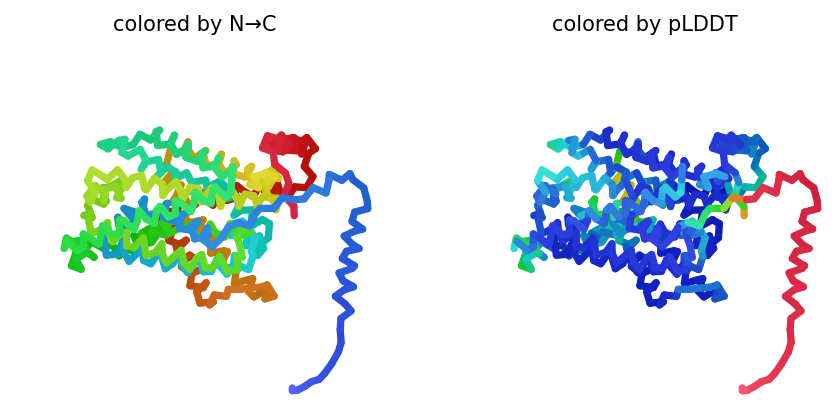

2023-09-11 02:07:29,899 alphafold2_ptm_model_2_seed_013 recycle=0 pLDDT=76.4 pTM=0.775
2023-09-11 02:07:34,793 alphafold2_ptm_model_2_seed_013 recycle=1 pLDDT=81.3 pTM=0.795 tol=2.17
2023-09-11 02:07:39,663 alphafold2_ptm_model_2_seed_013 recycle=2 pLDDT=82.1 pTM=0.792 tol=2.44
2023-09-11 02:07:44,588 alphafold2_ptm_model_2_seed_013 recycle=3 pLDDT=83.4 pTM=0.806 tol=0.318
2023-09-11 02:07:44,589 alphafold2_ptm_model_2_seed_013 took 19.6s (3 recycles)


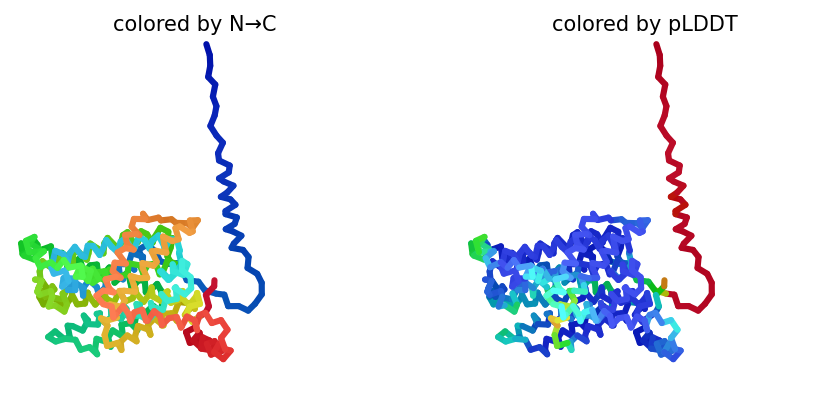

2023-09-11 02:07:49,974 alphafold2_ptm_model_3_seed_013 recycle=0 pLDDT=67.3 pTM=0.685
2023-09-11 02:07:54,870 alphafold2_ptm_model_3_seed_013 recycle=1 pLDDT=80.6 pTM=0.797 tol=4.39
2023-09-11 02:07:59,728 alphafold2_ptm_model_3_seed_013 recycle=2 pLDDT=83.2 pTM=0.803 tol=1.03
2023-09-11 02:08:04,632 alphafold2_ptm_model_3_seed_013 recycle=3 pLDDT=83.3 pTM=0.807 tol=0.815
2023-09-11 02:08:04,634 alphafold2_ptm_model_3_seed_013 took 19.5s (3 recycles)


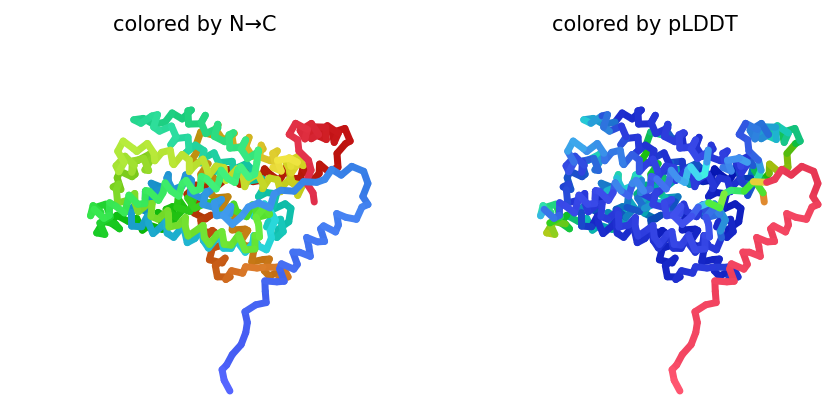

2023-09-11 02:08:10,079 alphafold2_ptm_model_4_seed_013 recycle=0 pLDDT=80.5 pTM=0.806
2023-09-11 02:08:14,990 alphafold2_ptm_model_4_seed_013 recycle=1 pLDDT=83.2 pTM=0.805 tol=1.57
2023-09-11 02:08:19,856 alphafold2_ptm_model_4_seed_013 recycle=2 pLDDT=83.3 pTM=0.802 tol=1.56
2023-09-11 02:08:24,782 alphafold2_ptm_model_4_seed_013 recycle=3 pLDDT=83.9 pTM=0.816 tol=0.542
2023-09-11 02:08:24,783 alphafold2_ptm_model_4_seed_013 took 19.6s (3 recycles)


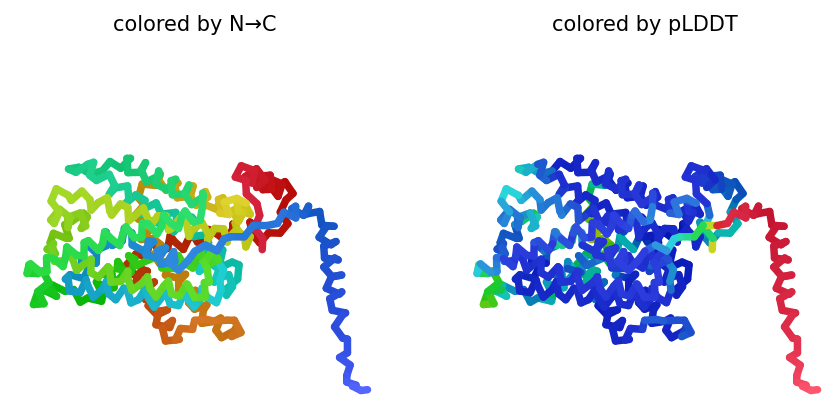

2023-09-11 02:08:30,222 alphafold2_ptm_model_5_seed_013 recycle=0 pLDDT=80.6 pTM=0.814
2023-09-11 02:08:35,131 alphafold2_ptm_model_5_seed_013 recycle=1 pLDDT=81.4 pTM=0.798 tol=2.06
2023-09-11 02:08:40,019 alphafold2_ptm_model_5_seed_013 recycle=2 pLDDT=82.7 pTM=0.816 tol=1.89
2023-09-11 02:08:44,977 alphafold2_ptm_model_5_seed_013 recycle=3 pLDDT=83.6 pTM=0.824 tol=1.51
2023-09-11 02:08:44,979 alphafold2_ptm_model_5_seed_013 took 19.7s (3 recycles)


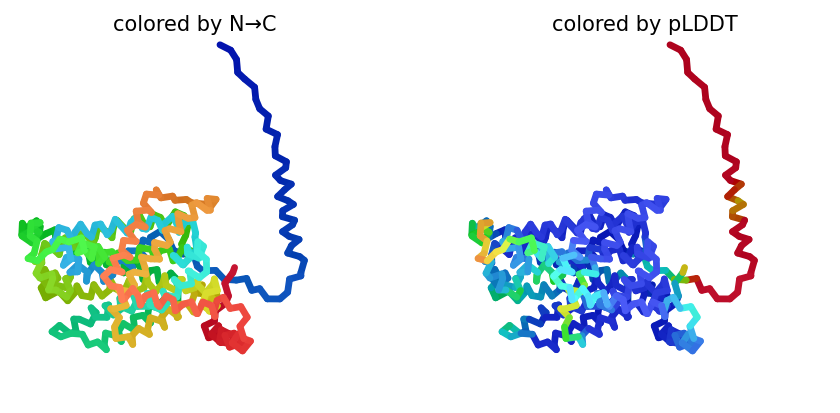

2023-09-11 02:08:53,833 alphafold2_ptm_model_1_seed_014 recycle=0 pLDDT=57.1 pTM=0.601
2023-09-11 02:08:58,646 alphafold2_ptm_model_1_seed_014 recycle=1 pLDDT=60.3 pTM=0.654 tol=6.05
2023-09-11 02:09:03,501 alphafold2_ptm_model_1_seed_014 recycle=2 pLDDT=68.9 pTM=0.718 tol=4.4
2023-09-11 02:09:08,315 alphafold2_ptm_model_1_seed_014 recycle=3 pLDDT=75.6 pTM=0.761 tol=3.74
2023-09-11 02:09:08,316 alphafold2_ptm_model_1_seed_014 took 19.4s (3 recycles)


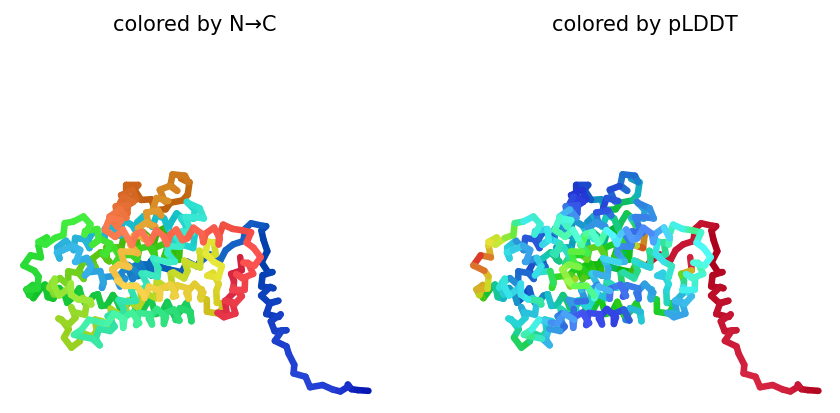

2023-09-11 02:09:13,759 alphafold2_ptm_model_2_seed_014 recycle=0 pLDDT=69.9 pTM=0.711
2023-09-11 02:09:18,615 alphafold2_ptm_model_2_seed_014 recycle=1 pLDDT=80.6 pTM=0.79 tol=5.57
2023-09-11 02:09:23,531 alphafold2_ptm_model_2_seed_014 recycle=2 pLDDT=82.1 pTM=0.8 tol=2
2023-09-11 02:09:28,376 alphafold2_ptm_model_2_seed_014 recycle=3 pLDDT=80.2 pTM=0.777 tol=1.48
2023-09-11 02:09:28,377 alphafold2_ptm_model_2_seed_014 took 19.5s (3 recycles)


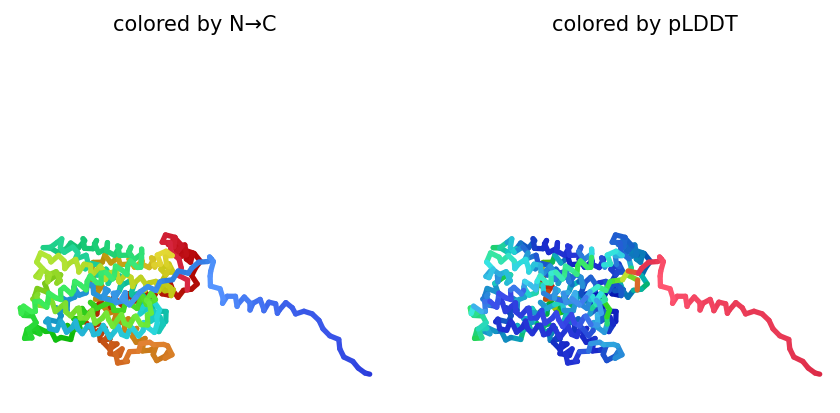

2023-09-11 02:09:33,786 alphafold2_ptm_model_3_seed_014 recycle=0 pLDDT=44.1 pTM=0.369
2023-09-11 02:09:38,612 alphafold2_ptm_model_3_seed_014 recycle=1 pLDDT=64.9 pTM=0.668 tol=9.49
2023-09-11 02:09:43,475 alphafold2_ptm_model_3_seed_014 recycle=2 pLDDT=65.4 pTM=0.681 tol=5.52
2023-09-11 02:09:48,303 alphafold2_ptm_model_3_seed_014 recycle=3 pLDDT=75.4 pTM=0.732 tol=2.69
2023-09-11 02:09:48,304 alphafold2_ptm_model_3_seed_014 took 19.4s (3 recycles)


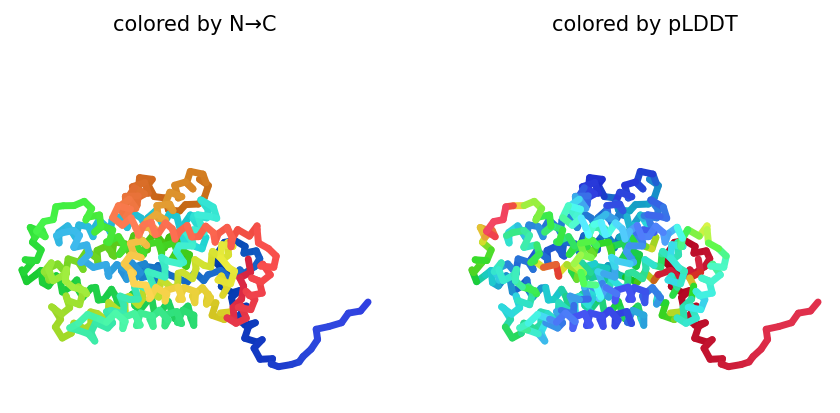

2023-09-11 02:09:53,738 alphafold2_ptm_model_4_seed_014 recycle=0 pLDDT=68.9 pTM=0.715
2023-09-11 02:09:58,595 alphafold2_ptm_model_4_seed_014 recycle=1 pLDDT=80.4 pTM=0.792 tol=3.85
2023-09-11 02:10:03,525 alphafold2_ptm_model_4_seed_014 recycle=2 pLDDT=83.6 pTM=0.819 tol=2.4
2023-09-11 02:10:08,378 alphafold2_ptm_model_4_seed_014 recycle=3 pLDDT=81.9 pTM=0.798 tol=2.74
2023-09-11 02:10:08,379 alphafold2_ptm_model_4_seed_014 took 19.5s (3 recycles)


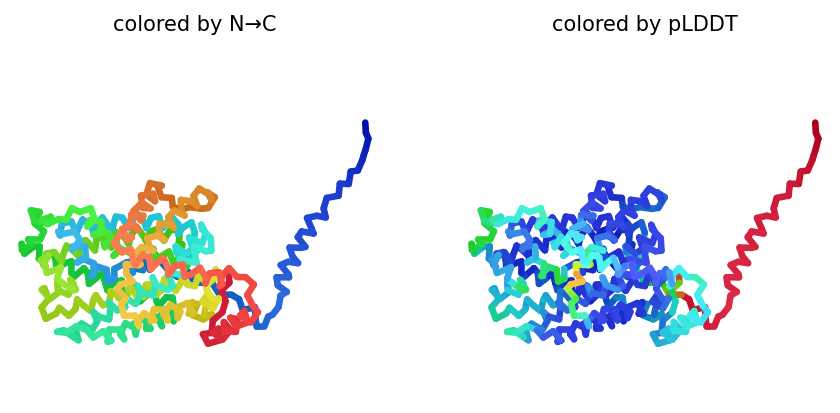

2023-09-11 02:10:13,868 alphafold2_ptm_model_5_seed_014 recycle=0 pLDDT=79.2 pTM=0.798
2023-09-11 02:10:18,776 alphafold2_ptm_model_5_seed_014 recycle=1 pLDDT=83.8 pTM=0.817 tol=4.02
2023-09-11 02:10:23,733 alphafold2_ptm_model_5_seed_014 recycle=2 pLDDT=84.4 pTM=0.828 tol=2.88
2023-09-11 02:10:28,616 alphafold2_ptm_model_5_seed_014 recycle=3 pLDDT=83.6 pTM=0.819 tol=0.583
2023-09-11 02:10:28,617 alphafold2_ptm_model_5_seed_014 took 19.7s (3 recycles)


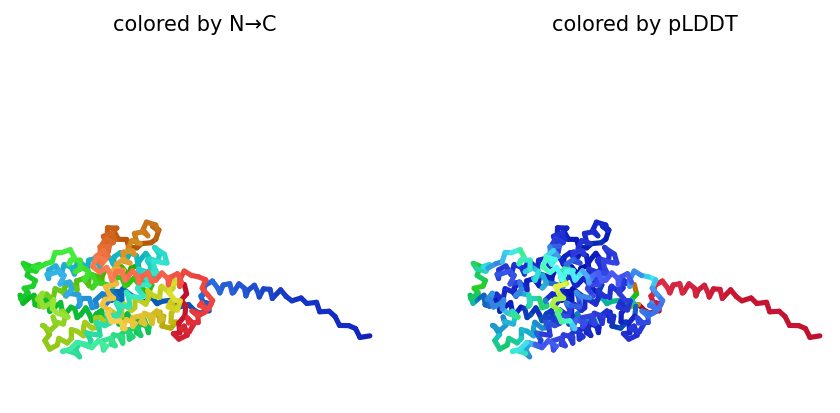

2023-09-11 02:10:37,530 alphafold2_ptm_model_1_seed_015 recycle=0 pLDDT=61.1 pTM=0.631
2023-09-11 02:10:42,412 alphafold2_ptm_model_1_seed_015 recycle=1 pLDDT=78.4 pTM=0.795 tol=5.73
2023-09-11 02:10:47,299 alphafold2_ptm_model_1_seed_015 recycle=2 pLDDT=79.4 pTM=0.797 tol=1.69
2023-09-11 02:10:52,171 alphafold2_ptm_model_1_seed_015 recycle=3 pLDDT=79.1 pTM=0.774 tol=2.38
2023-09-11 02:10:52,173 alphafold2_ptm_model_1_seed_015 took 19.5s (3 recycles)


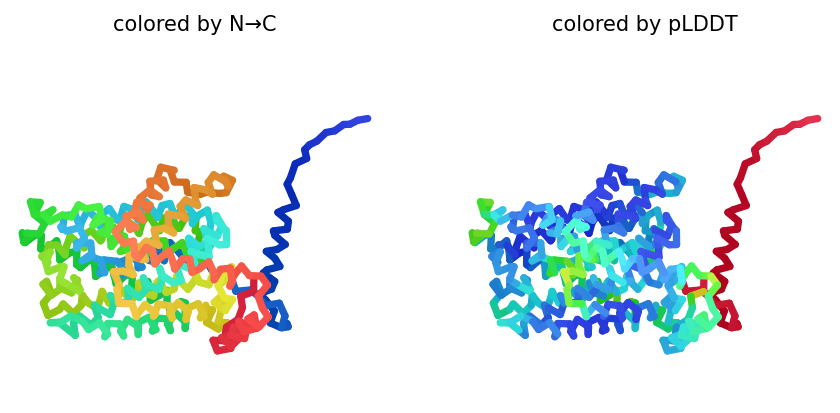

2023-09-11 02:10:57,602 alphafold2_ptm_model_2_seed_015 recycle=0 pLDDT=70.4 pTM=0.729
2023-09-11 02:11:02,487 alphafold2_ptm_model_2_seed_015 recycle=1 pLDDT=80.3 pTM=0.801 tol=3.93
2023-09-11 02:11:07,370 alphafold2_ptm_model_2_seed_015 recycle=2 pLDDT=80.5 pTM=0.802 tol=1.15
2023-09-11 02:11:12,256 alphafold2_ptm_model_2_seed_015 recycle=3 pLDDT=81.1 pTM=0.787 tol=0.664
2023-09-11 02:11:12,258 alphafold2_ptm_model_2_seed_015 took 19.5s (3 recycles)


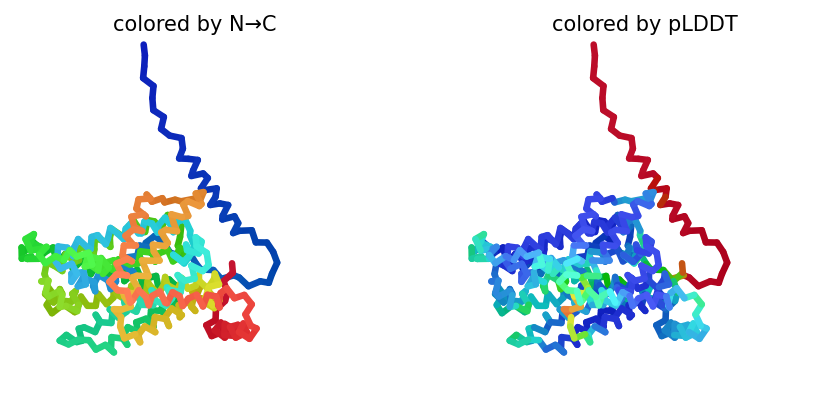

2023-09-11 02:11:17,674 alphafold2_ptm_model_3_seed_015 recycle=0 pLDDT=58.2 pTM=0.608
2023-09-11 02:11:22,544 alphafold2_ptm_model_3_seed_015 recycle=1 pLDDT=74.4 pTM=0.728 tol=4.7
2023-09-11 02:11:27,421 alphafold2_ptm_model_3_seed_015 recycle=2 pLDDT=79.4 pTM=0.772 tol=2.91
2023-09-11 02:11:32,317 alphafold2_ptm_model_3_seed_015 recycle=3 pLDDT=82.4 pTM=0.801 tol=0.717
2023-09-11 02:11:32,318 alphafold2_ptm_model_3_seed_015 took 19.5s (3 recycles)


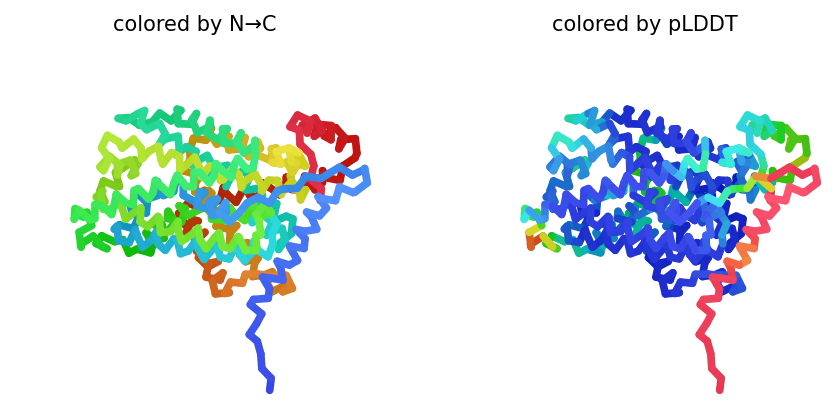

2023-09-11 02:11:37,764 alphafold2_ptm_model_4_seed_015 recycle=0 pLDDT=73.5 pTM=0.752
2023-09-11 02:11:42,648 alphafold2_ptm_model_4_seed_015 recycle=1 pLDDT=79.8 pTM=0.79 tol=4.16
2023-09-11 02:11:47,552 alphafold2_ptm_model_4_seed_015 recycle=2 pLDDT=82.3 pTM=0.806 tol=3.13
2023-09-11 02:11:52,467 alphafold2_ptm_model_4_seed_015 recycle=3 pLDDT=83.4 pTM=0.812 tol=0.961
2023-09-11 02:11:52,468 alphafold2_ptm_model_4_seed_015 took 19.6s (3 recycles)


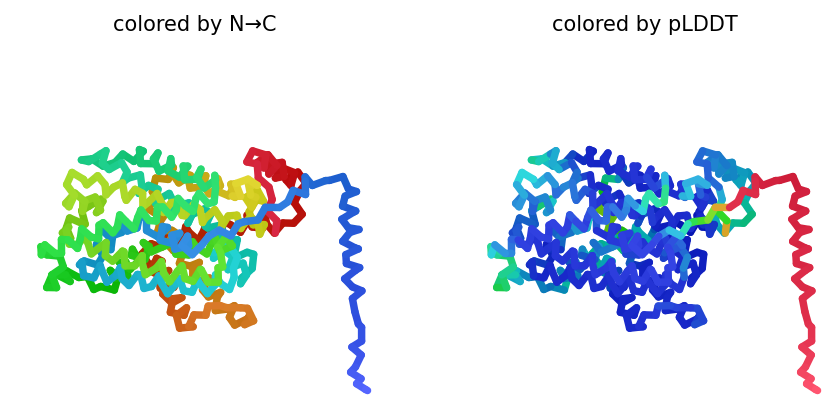

2023-09-11 02:11:57,932 alphafold2_ptm_model_5_seed_015 recycle=0 pLDDT=79.1 pTM=0.801
2023-09-11 02:12:02,869 alphafold2_ptm_model_5_seed_015 recycle=1 pLDDT=82.2 pTM=0.815 tol=1.39
2023-09-11 02:12:07,799 alphafold2_ptm_model_5_seed_015 recycle=2 pLDDT=83.2 pTM=0.821 tol=1.43
2023-09-11 02:12:12,750 alphafold2_ptm_model_5_seed_015 recycle=3 pLDDT=84.8 pTM=0.825 tol=1.48
2023-09-11 02:12:12,751 alphafold2_ptm_model_5_seed_015 took 19.7s (3 recycles)


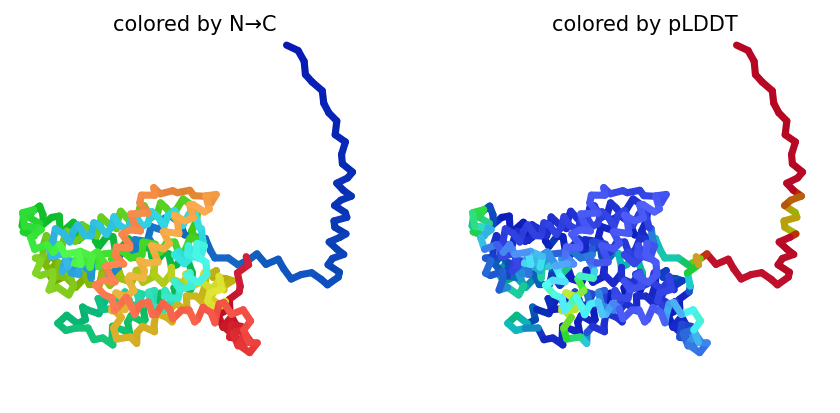

2023-09-11 02:12:13,296 reranking models by 'plddt' metric
2023-09-11 02:12:13,298 rank_001_alphafold2_ptm_model_5_seed_008 pLDDT=86 pTM=0.838
2023-09-11 02:12:13,298 rank_002_alphafold2_ptm_model_3_seed_003 pLDDT=85.6 pTM=0.836
2023-09-11 02:12:13,299 rank_003_alphafold2_ptm_model_5_seed_003 pLDDT=84.9 pTM=0.823
2023-09-11 02:12:13,299 rank_004_alphafold2_ptm_model_5_seed_015 pLDDT=84.8 pTM=0.825
2023-09-11 02:12:13,300 rank_005_alphafold2_ptm_model_3_seed_004 pLDDT=84.6 pTM=0.821
2023-09-11 02:12:13,300 rank_006_alphafold2_ptm_model_5_seed_002 pLDDT=84.6 pTM=0.823
2023-09-11 02:12:13,300 rank_007_alphafold2_ptm_model_3_seed_008 pLDDT=84.5 pTM=0.825
2023-09-11 02:12:13,301 rank_008_alphafold2_ptm_model_4_seed_008 pLDDT=84.4 pTM=0.823
2023-09-11 02:12:13,301 rank_009_alphafold2_ptm_model_5_seed_001 pLDDT=84.3 pTM=0.828
2023-09-11 02:12:13,302 rank_010_alphafold2_ptm_model_4_seed_003 pLDDT=84.2 pTM=0.813
2023-09-11 02:12:13,302 rank_011_alphafold2_ptm_model_5_seed_011 pLDDT=84.2 pTM=0.8

0

In [ ]:
#@title Run Prediction
display_images = True #@param {type:"boolean"}

import sys
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
from Bio import BiopythonDeprecationWarning
warnings.simplefilter(action='ignore', category=BiopythonDeprecationWarning)
from pathlib import Path
from colabfold.download import download_alphafold_params, default_data_dir
from colabfold.utils import setup_logging
from colabfold.batch import get_queries, run, set_model_type
from colabfold.plot import plot_msa_v2

import os
import numpy as np
try:
  K80_chk = os.popen('nvidia-smi | grep "Tesla K80" | wc -l').read()
except:
  K80_chk = "0"
  pass
if "1" in K80_chk:
  print("WARNING: found GPU Tesla K80: limited to total length < 1000")
  if "TF_FORCE_UNIFIED_MEMORY" in os.environ:
    del os.environ["TF_FORCE_UNIFIED_MEMORY"]
  if "XLA_PYTHON_CLIENT_MEM_FRACTION" in os.environ:
    del os.environ["XLA_PYTHON_CLIENT_MEM_FRACTION"]

from colabfold.colabfold import plot_protein
from pathlib import Path
import matplotlib.pyplot as plt

# For some reason we need that to get pdbfixer to import
if use_amber and f"/usr/local/lib/python{python_version}/site-packages/" not in sys.path:
    sys.path.insert(0, f"/usr/local/lib/python{python_version}/site-packages/")

def input_features_callback(input_features):
  if display_images:
    plot_msa_v2(input_features)
    plt.show()
    plt.close()

def prediction_callback(protein_obj, length,
                        prediction_result, input_features, mode):
  model_name, relaxed = mode
  if not relaxed:
    if display_images:
      fig = plot_protein(protein_obj, Ls=length, dpi=150)
      plt.show()
      plt.close()

result_dir = jobname
log_filename = os.path.join(jobname,"log.txt")
if not os.path.isfile(log_filename) or 'logging_setup' not in globals():
  setup_logging(Path(log_filename))
  logging_setup = True

queries, is_complex = get_queries(queries_path)
model_type = set_model_type(is_complex, model_type)

if "multimer" in model_type and max_msa is not None:
  use_cluster_profile = False
else:
  use_cluster_profile = True

download_alphafold_params(model_type, Path("."))
results = run(
    queries=queries,
    result_dir=result_dir,
    use_templates=use_templates,
    custom_template_path=custom_template_path,
    num_relax=num_relax,
    msa_mode=msa_mode,
    model_type=model_type,
    num_models=5,
    num_recycles=num_recycles,
    recycle_early_stop_tolerance=recycle_early_stop_tolerance,
    num_seeds=num_seeds,
    use_dropout=use_dropout,
    model_order=[1,2,3,4,5],
    is_complex=is_complex,
    data_dir=Path("."),
    keep_existing_results=False,
    rank_by="auto",
    pair_mode=pair_mode,
    pairing_strategy=pairing_strategy,
    stop_at_score=float(100),
    prediction_callback=prediction_callback,
    dpi=dpi,
    zip_results=False,
    save_all=save_all,
    max_msa=max_msa,
    use_cluster_profile=use_cluster_profile,
    input_features_callback=input_features_callback,
    save_recycles=save_recycles,
)
results_zip = f"{jobname}.result.zip"
os.system(f"zip -r {results_zip} {jobname}")

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

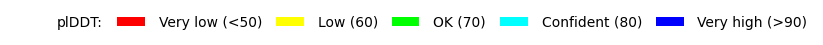

In [ ]:
#@title Display 3D structure {run: "auto"}
import py3Dmol
import glob
import matplotlib.pyplot as plt
from colabfold.colabfold import plot_plddt_legend
from colabfold.colabfold import pymol_color_list, alphabet_list
rank_num = 1 #@param ["1", "2", "3", "4", "5"] {type:"raw"}
color = "lDDT" #@param ["chain", "lDDT", "rainbow"]
show_sidechains = False #@param {type:"boolean"}
show_mainchains = False #@param {type:"boolean"}

tag = results["rank"][0][rank_num - 1]
jobname_prefix = ".custom" if msa_mode == "custom" else ""
pdb_filename = f"{jobname}/{jobname}{jobname_prefix}_unrelaxed_{tag}.pdb"
pdb_file = glob.glob(pdb_filename)

def show_pdb(rank_num=1, show_sidechains=False, show_mainchains=False, color="lDDT"):
  model_name = f"rank_{rank_num}"
  view = py3Dmol.view(js='https://3dmol.org/build/3Dmol.js',)
  view.addModel(open(pdb_file[0],'r').read(),'pdb')

  if color == "lDDT":
    view.setStyle({'cartoon': {'colorscheme': {'prop':'b','gradient': 'roygb','min':50,'max':90}}})
  elif color == "rainbow":
    view.setStyle({'cartoon': {'color':'spectrum'}})
  elif color == "chain":
    chains = len(queries[0][1]) + 1 if is_complex else 1
    for n,chain,color in zip(range(chains),alphabet_list,pymol_color_list):
       view.setStyle({'chain':chain},{'cartoon': {'color':color}})

  if show_sidechains:
    BB = ['C','O','N']
    view.addStyle({'and':[{'resn':["GLY","PRO"],'invert':True},{'atom':BB,'invert':True}]},
                        {'stick':{'colorscheme':f"WhiteCarbon",'radius':0.3}})
    view.addStyle({'and':[{'resn':"GLY"},{'atom':'CA'}]},
                        {'sphere':{'colorscheme':f"WhiteCarbon",'radius':0.3}})
    view.addStyle({'and':[{'resn':"PRO"},{'atom':['C','O'],'invert':True}]},
                        {'stick':{'colorscheme':f"WhiteCarbon",'radius':0.3}})
  if show_mainchains:
    BB = ['C','O','N','CA']
    view.addStyle({'atom':BB},{'stick':{'colorscheme':f"WhiteCarbon",'radius':0.3}})

  view.zoomTo()
  return view

show_pdb(rank_num, show_sidechains, show_mainchains, color).show()
if color == "lDDT":
  plot_plddt_legend().show()


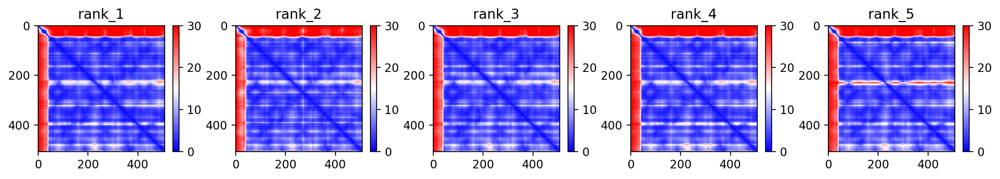
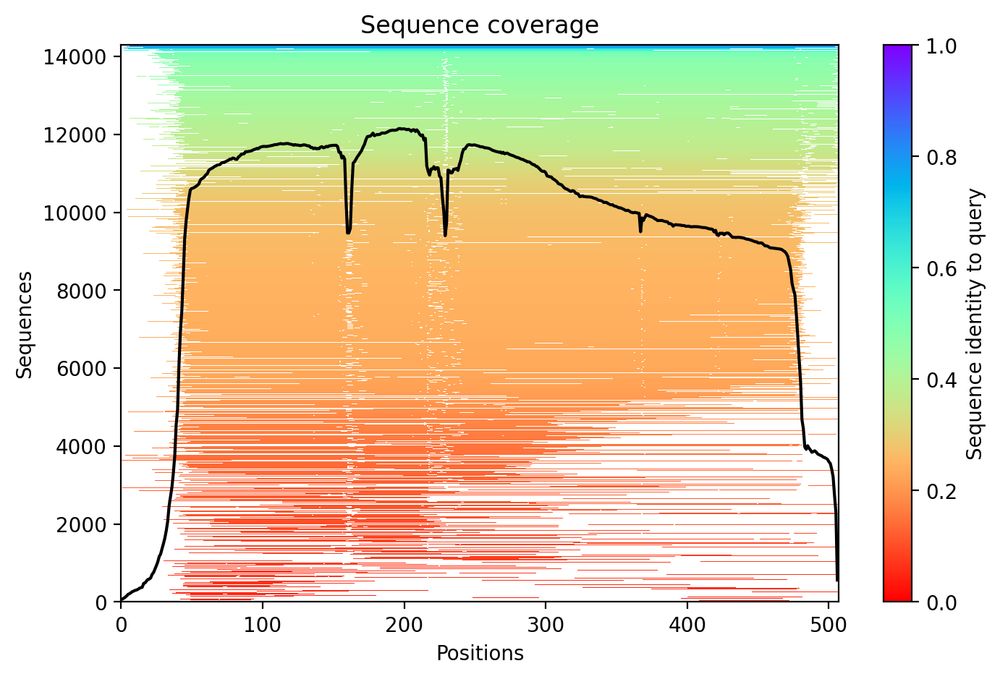
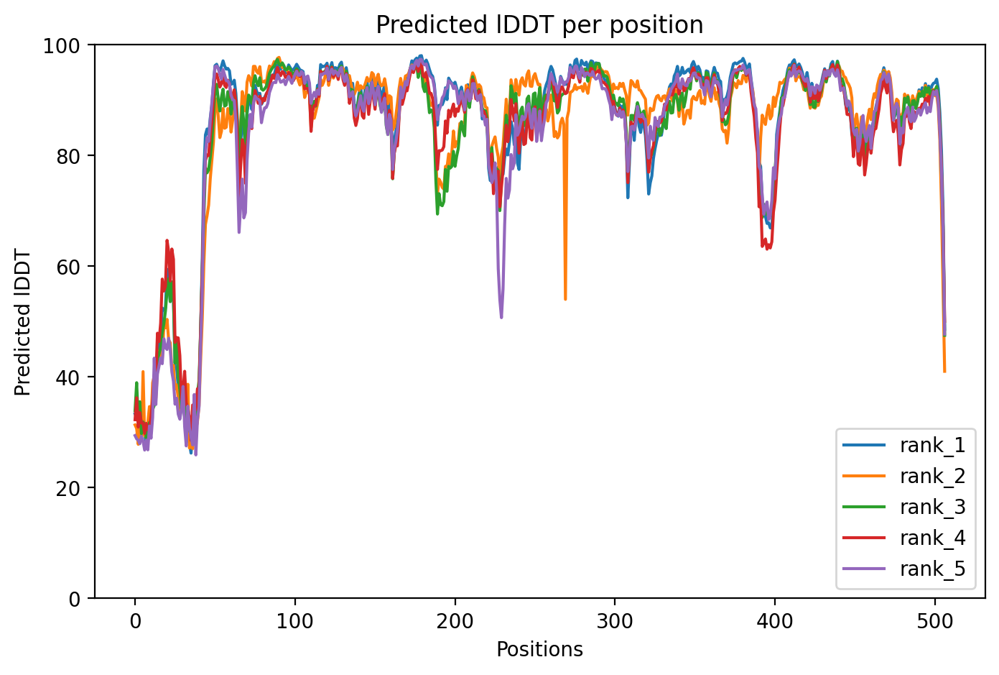

In [ ]:
#@title Plots {run: "auto"}
from IPython.display import display, HTML
import base64
from html import escape

# see: https://stackoverflow.com/a/53688522
def image_to_data_url(filename):
  ext = filename.split('.')[-1]
  prefix = f'data:image/{ext};base64,'
  with open(filename, 'rb') as f:
    img = f.read()
  return prefix + base64.b64encode(img).decode('utf-8')

pae = image_to_data_url(os.path.join(jobname,f"{jobname}{jobname_prefix}_pae.png"))
cov = image_to_data_url(os.path.join(jobname,f"{jobname}{jobname_prefix}_coverage.png"))
plddt = image_to_data_url(os.path.join(jobname,f"{jobname}{jobname_prefix}_plddt.png"))
display(HTML(f"""
<style>
  img {{
    float:left;
  }}
  .full {{
    max-width:100%;
  }}
  .half {{
    max-width:50%;
  }}
  @media (max-width:640px) {{
    .half {{
      max-width:100%;
    }}
  }}
</style>
<div style="max-width:90%; padding:2em;">
  <h1>Plots for {escape(jobname)}</h1>
  <img src="{pae}" class="full" />
  <img src="{cov}" class="half" />
  <img src="{plddt}" class="half" />
</div>
"""))


In [ ]:
#@title Package and download results
#@markdown If you are having issues downloading the result archive, try disabling your adblocker and run this cell again. If that fails click on the little folder icon to the left, navigate to file: `jobname.result.zip`, right-click and select \"Download\" (see [screenshot](https://pbs.twimg.com/media/E6wRW2lWUAEOuoe?format=jpg&name=small)).

if msa_mode == "custom":
  print("Don't forget to cite your custom MSA generation method.")

files.download(f"{jobname}.result.zip")

if save_to_google_drive == True and drive:
  uploaded = drive.CreateFile({'title': f"{jobname}.result.zip"})
  uploaded.SetContentFile(f"{jobname}.result.zip")
  uploaded.Upload()
  print(f"Uploaded {jobname}.result.zip to Google Drive with ID {uploaded.get('id')}")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# Instructions <a name="Instructions"></a>
**Quick start**
1. Paste your protein sequence(s) in the input field.
2. Press "Runtime" -> "Run all".
3. The pipeline consists of 5 steps. The currently running step is indicated by a circle with a stop sign next to it.

**Result zip file contents**

1. PDB formatted structures sorted by avg. pLDDT and complexes are sorted by pTMscore. (unrelaxed and relaxed if `use_amber` is enabled).
2. Plots of the model quality.
3. Plots of the MSA coverage.
4. Parameter log file.
5. A3M formatted input MSA.
6. A `predicted_aligned_error_v1.json` using [AlphaFold-DB's format](https://alphafold.ebi.ac.uk/faq#faq-7) and a `scores.json` for each model which contains an array (list of lists) for PAE, a list with the average pLDDT and the pTMscore.
7. BibTeX file with citations for all used tools and databases.

At the end of the job a download modal box will pop up with a `jobname.result.zip` file. Additionally, if the `save_to_google_drive` option was selected, the `jobname.result.zip` will be uploaded to your Google Drive.

**MSA generation for complexes**

For the complex prediction we use unpaired and paired MSAs. Unpaired MSA is generated the same way as for the protein structures prediction by searching the UniRef100 and environmental sequences three iterations each.

The paired MSA is generated by searching the UniRef100 database and pairing the best hits sharing the same NCBI taxonomic identifier (=species or sub-species). We only pair sequences if all of the query sequences are present for the respective taxonomic identifier.

**Using a custom MSA as input**

To predict the structure with a custom MSA (A3M formatted): (1) Change the `msa_mode`: to "custom", (2) Wait for an upload box to appear at the end of the "MSA options ..." box. Upload your A3M. The first fasta entry of the A3M must be the query sequence without gaps.

It is also possilbe to proide custom MSAs for complex predictions. Read more about the format [here](https://github.com/sokrypton/ColabFold/issues/76).

As an alternative for MSA generation the [HHblits Toolkit server](https://toolkit.tuebingen.mpg.de/tools/hhblits) can be used. After submitting your query, click "Query Template MSA" -> "Download Full A3M". Download the A3M file and upload it in this notebook.

**PDB100** <a name="pdb100"></a>

As of 23/06/08, we have transitioned from using the PDB70 to a 100% clustered PDB, the PDB100. The construction methodology of PDB100 differs from that of PDB70.

The PDB70 was constructed by running each PDB70 representative sequence through [HHblits](https://github.com/soedinglab/hh-suite) against the [Uniclust30](https://uniclust.mmseqs.com/). On the other hand, the PDB100 is built by searching each PDB100 representative structure with [Foldseek](https://github.com/steineggerlab/foldseek) against the [AlphaFold Database](https://alphafold.ebi.ac.uk).

To maintain compatibility with older Notebook versions and local installations, the generated files and API responses will continue to be named "PDB70", even though we're now using the PDB100.

**Using custom templates** <a name="custom_templates"></a>

To predict the structure with a custom template (PDB or mmCIF formatted): (1) change the `template_mode` to "custom" in the execute cell and (2) wait for an upload box to appear at the end of the "Input Protein" box. Select and upload your templates (multiple choices are possible).

* Templates must follow the four letter PDB naming with lower case letters.

* Templates in mmCIF format must contain `_entity_poly_seq`. An error is thrown if this field is not present. The field `_pdbx_audit_revision_history.revision_date` is automatically generated if it is not present.

* Templates in PDB format are automatically converted to the mmCIF format. `_entity_poly_seq` and `_pdbx_audit_revision_history.revision_date` are automatically generated.

If you encounter problems, please report them to this [issue](https://github.com/sokrypton/ColabFold/issues/177).

**Comparison to the full AlphaFold2 and AlphaFold2 Colab**

This notebook replaces the homology detection and MSA pairing of AlphaFold2 with MMseqs2. For a comparison against the [AlphaFold2 Colab](https://colab.research.google.com/github/deepmind/alphafold/blob/main/notebooks/AlphaFold.ipynb) and the full [AlphaFold2](https://github.com/deepmind/alphafold) system read our [paper](https://www.nature.com/articles/s41592-022-01488-1).

**Troubleshooting**
* Check that the runtime type is set to GPU at "Runtime" -> "Change runtime type".
* Try to restart the session "Runtime" -> "Factory reset runtime".
* Check your input sequence.

**Known issues**
* Google Colab assigns different types of GPUs with varying amount of memory. Some might not have enough memory to predict the structure for a long sequence.
* Your browser can block the pop-up for downloading the result file. You can choose the `save_to_google_drive` option to upload to Google Drive instead or manually download the result file: Click on the little folder icon to the left, navigate to file: `jobname.result.zip`, right-click and select \"Download\" (see [screenshot](https://pbs.twimg.com/media/E6wRW2lWUAEOuoe?format=jpg&name=small)).

**Limitations**
* Computing resources: Our MMseqs2 API can handle ~20-50k requests per day.
* MSAs: MMseqs2 is very precise and sensitive but might find less hits compared to HHblits/HMMer searched against BFD or MGnify.
* We recommend to additionally use the full [AlphaFold2 pipeline](https://github.com/deepmind/alphafold).

**Description of the plots**
*   **Number of sequences per position** - We want to see at least 30 sequences per position, for best performance, ideally 100 sequences.
*   **Predicted lDDT per position** - model confidence (out of 100) at each position. The higher the better.
*   **Predicted Alignment Error** - For homooligomers, this could be a useful metric to assess how confident the model is about the interface. The lower the better.

**Bugs**
- If you encounter any bugs, please report the issue to https://github.com/sokrypton/ColabFold/issues

**License**

The source code of ColabFold is licensed under [MIT](https://raw.githubusercontent.com/sokrypton/ColabFold/main/LICENSE). Additionally, this notebook uses the AlphaFold2 source code and its parameters licensed under [Apache 2.0](https://raw.githubusercontent.com/deepmind/alphafold/main/LICENSE) and [CC BY 4.0](https://creativecommons.org/licenses/by-sa/4.0/) respectively. Read more about the AlphaFold license [here](https://github.com/deepmind/alphafold).

**Acknowledgments**
- We thank the AlphaFold team for developing an excellent model and open sourcing the software.

- [KOBIC](https://kobic.re.kr) and [Söding Lab](https://www.mpinat.mpg.de/soeding) for providing the computational resources for the MMseqs2 MSA server.

- Richard Evans for helping to benchmark the ColabFold's Alphafold-multimer support.

- [David Koes](https://github.com/dkoes) for his awesome [py3Dmol](https://3dmol.csb.pitt.edu/) plugin, without whom these notebooks would be quite boring!

- Do-Yoon Kim for creating the ColabFold logo.

- A colab by Sergey Ovchinnikov ([@sokrypton](https://twitter.com/sokrypton)), Milot Mirdita ([@milot_mirdita](https://twitter.com/milot_mirdita)) and Martin Steinegger ([@thesteinegger](https://twitter.com/thesteinegger)).
